<a href="https://colab.research.google.com/github/Luanpedro21/Article_Sugarcane/blob/main/Temporal_SugarCane_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
!pip install nbstripout
!nbstripout

object address  : 0x7852c0436200
object refcount : 2
object type     : 0x9d7580
object type name: KeyboardInterrupt
object repr     : KeyboardInterrupt()
lost sys.stderr
Traceback (most recent call last):
^C


In [18]:
import nbformat

# Caminho do notebook atual
filename = "/content/drive/MyDrive/Colab Notebooks/Temporal SugarCane .ipynb"

# Carrega o notebook
with open(filename, 'r', encoding='utf-8') as f:
    nb = nbformat.read(f, as_version=4)

# Remove widgets problemáticos
if 'widgets' in nb['metadata']:
    del nb['metadata']['widgets']

# Salva novamente
with open(filename, 'w', encoding='utf-8') as f:
    nbformat.write(nb, f)

print("Widgets removidos com sucesso!")

Widgets removidos com sucesso!


In [9]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/MyDrive/Article Temporal SugarCane'

Mounted at /content/drive


In [ ]:
from google.colab import drive
import zipfile
import os

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Define the path to the ZIP files in Drive
drive_path = '/content/drive/MyDrive/Article Temporal SugarCane'
zip_cana = os.path.join(drive_path, 'cana.zip')
zip_soja = os.path.join(drive_path, 'soja.zip')

# 3. Create temporary directories in Colab
os.makedirs('/content/', exist_ok=True)
os.makedirs('/content/soja', exist_ok=True)

# 4. Function to unzip files
def unzip(zip_path, destination):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(destination)
        print(f'Unzipped: {zip_path} → {destination}')

# 5. Run unzip
unzip(zip_cana, '/content/cana')
unzip(zip_soja, '/content/soja')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Unzipped: /content/drive/MyDrive/Article Temporal SugarCane/cana.zip → /content/cana
Unzipped: /content/drive/MyDrive/Article Temporal SugarCane/soja.zip → /content/soja


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 70.3 MB/s eta 0:00:00
Format: 4 bands - Dimensions: 1805x1706


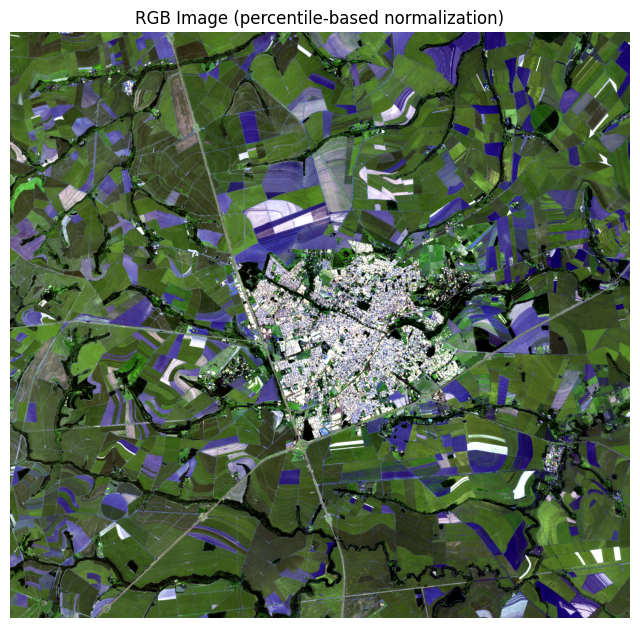

In [ ]:
!pip install rasterio

import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Path to the image
image_path = '/content/cana/cana/cana/jaboticabal/3.tif'  # Adjust as needed

# Percentile-based normalization function (for better visualization)
def normalize(band):
    p2, p98 = np.percentile(band, [2, 98])
    band_clipped = np.clip(band, p2, p98)
    return (band_clipped - p2) / (p98 - p2)

# Open and display RGB image
with rasterio.open(image_path) as src:
    print(f"Format: {src.count} bands - Dimensions: {src.width}x{src.height}")

    if src.count >= 3:
        r = src.read(1).astype(np.float32)
        g = src.read(2).astype(np.float32)
        b = src.read(3).astype(np.float32)

        img_rgb = np.dstack([
            normalize(r),
            normalize(g),
            normalize(b)
        ])

        plt.figure(figsize=(8, 8))
        plt.imshow(img_rgb)
        plt.title("RGB Image (percentile-based normalization)")
        plt.axis('off')

        # Save as EPS
        plt.savefig('imagem_rgb.eps', format='eps', bbox_inches='tight', pad_inches=0)

        plt.show()


In [ ]:
!pip install rasterio
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

# Path to input image
image_path = '/content/cana/cana/cana/piracicaba/3.tif'

# Output path
output_tif = '/content/ndvi_jaboticabal3.tif'

# Open the image and calculate NDVI
with rasterio.open(image_path) as src:
    if src.count < 4:
        raise ValueError("The image must have at least 4 bands (expected: RGB + NIR)")

    red = src.read(3).astype("float32")  # Band 3: RED
    nir = src.read(4).astype("float32")  # Band 4: NIR
    profile = src.profile.copy()

# Calculate NDVI and apply mask for invalid pixels
mask = (red == 0) | (nir == 0)
ndvi = (nir - red) / (nir + red + 1e-6)
ndvi_masked = np.where(mask, -9999, ndvi)

# Update metadata and save as GeoTIFF
profile.update({
    'count': 1,
    'dtype': 'float32',
    'nodata': -9999
})

with rasterio.open(output_tif, 'w', **profile) as dst:
    dst.write(ndvi_masked, 1)

print(f"NDVI saved to: {output_tif}")


NDVI saved to: /content/ndvi_jaboticabal3.tif


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


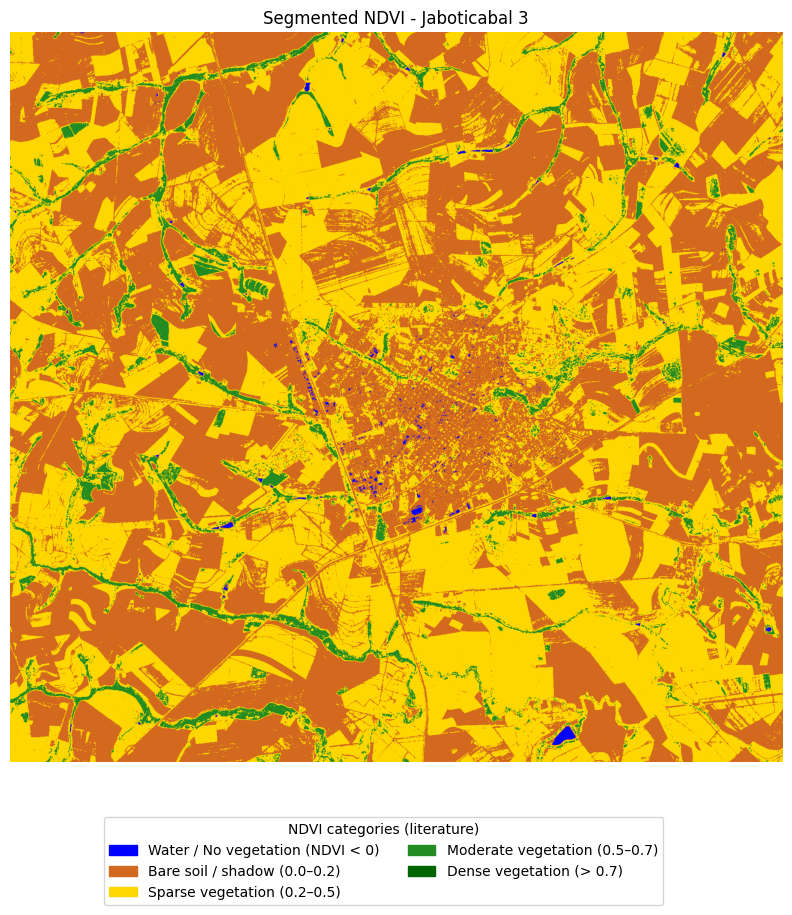

NDVI RGB GeoTIFF saved to: /content/drive/MyDrive/Article Temporal SugarCane/NDVI_Clas_RGB/ndvi_jaboticabal3_segmented.tif
NDVI EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/NDVI_Clas_RGB/ndvi_jaboticabal3_segmented.eps


In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from google.colab import drive

# === Mount Google Drive
drive.mount('/content/drive')

# === Paths
input_ndvi = "/content/ndvi_jaboticabal3.tif"
output_folder = f"{drive_path}/NDVI_Clas_RGB"
os.makedirs(output_folder, exist_ok=True)

# === RGB colors for NDVI classes (based on literature)
colors = [
    [0, 0, 255],       # Class 0 - Deep Blue (NDVI < 0)
    [210, 105, 30],    # Class 1 - Brown (0.0–0.2)
    [255, 215, 0],     # Class 2 - Yellow (0.2–0.5)
    [34, 139, 34],     # Class 3 - Medium Green (0.5–0.7)
    [0, 100, 0],       # Class 4 - Dark Green (> 0.7)
]

legend_labels = [
    'Water / No vegetation (NDVI < 0)',
    'Bare soil / shadow (0.0–0.2)',
    'Sparse vegetation (0.2–0.5)',
    'Moderate vegetation (0.5–0.7)',
    'Dense vegetation (> 0.7)'
]

legend_patches = [
    mpatches.Patch(color=np.array(color) / 255, label=label)
    for color, label in zip(colors, legend_labels)
]

# === Read NDVI
with rasterio.open(input_ndvi) as src:
    ndvi = src.read(1).astype('float32')
    mask_raster = src.read_masks(1) > 0
    profile = src.profile.copy()

# === Valid mask
valid_mask = (mask_raster) & ~np.isnan(ndvi)

# === Classification
ndvi_class = np.full(ndvi.shape, -1)
ndvi_class[valid_mask & (ndvi < 0.0)] = 0
ndvi_class[valid_mask & (ndvi >= 0.0) & (ndvi < 0.2)] = 1
ndvi_class[valid_mask & (ndvi >= 0.2) & (ndvi < 0.5)] = 2
ndvi_class[valid_mask & (ndvi >= 0.5) & (ndvi < 0.7)] = 3
ndvi_class[valid_mask & (ndvi >= 0.7)] = 4

# === Convert to RGB image
ndvi_rgb = np.full((ndvi.shape[0], ndvi.shape[1], 3), 255, dtype=np.uint8)
for i, color in enumerate(colors):
    ndvi_rgb[ndvi_class == i] = color

# === Display and save EPS
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(ndvi_rgb)
ax.set_title('Segmented NDVI - Jaboticabal 3')
ax.axis('off')
fig.subplots_adjust(bottom=0.15)
fig.legend(
    handles=legend_patches,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.0),
    ncol=2,
    title='NDVI categories (literature)'
)

eps_output_path = os.path.join(output_folder, "ndvi_jaboticabal3_segmented.eps")
plt.savefig(eps_output_path, format='eps', dpi=300)
plt.show()

# === Save as RGB GeoTIFF
profile.update(
    driver='GTiff',
    dtype=rasterio.uint8,
    count=3,
    compress='lzw',
    nodata=None
)

rgb_output_tif = os.path.join(output_folder, "ndvi_jaboticabal3_segmented.tif")
with rasterio.open(rgb_output_tif, 'w', **profile) as dst:
    dst.write(ndvi_rgb[:, :, 0], 1)
    dst.write(ndvi_rgb[:, :, 1], 2)
    dst.write(ndvi_rgb[:, :, 2], 3)

print(f"NDVI RGB GeoTIFF saved to: {rgb_output_tif}")
print(f"NDVI EPS image saved to: {eps_output_path}")


In [ ]:
!pip install rasterio
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

# Path to input image
image_path = '/content/cana/cana/cana/piracicaba/9.tif'

# Output path
output_tif = '/content/ndvi_jaboticabal3.tif'

# Open the image and calculate NDVI
with rasterio.open(image_path) as src:
    if src.count < 4:
        raise ValueError("The image must have at least 4 bands (expected: RGB + NIR)")

    red = src.read(3).astype("float32")  # Band 3: RED
    nir = src.read(4).astype("float32")  # Band 4: NIR
    profile = src.profile.copy()

# Calculate NDVI and apply mask for invalid pixels
mask = (red == 0) | (nir == 0)
ndvi = (nir - red) / (nir + red + 1e-6)
ndvi_masked = np.where(mask, -9999, ndvi)

# Update metadata and save as GeoTIFF
profile.update({
    'count': 1,
    'dtype': 'float32',
    'nodata': -9999
})

with rasterio.open(output_tif, 'w', **profile) as dst:
    dst.write(ndvi_masked, 1)

print(f"NDVI saved to: {output_tif}")


NDVI saved to: /content/ndvi_jaboticabal3.tif


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


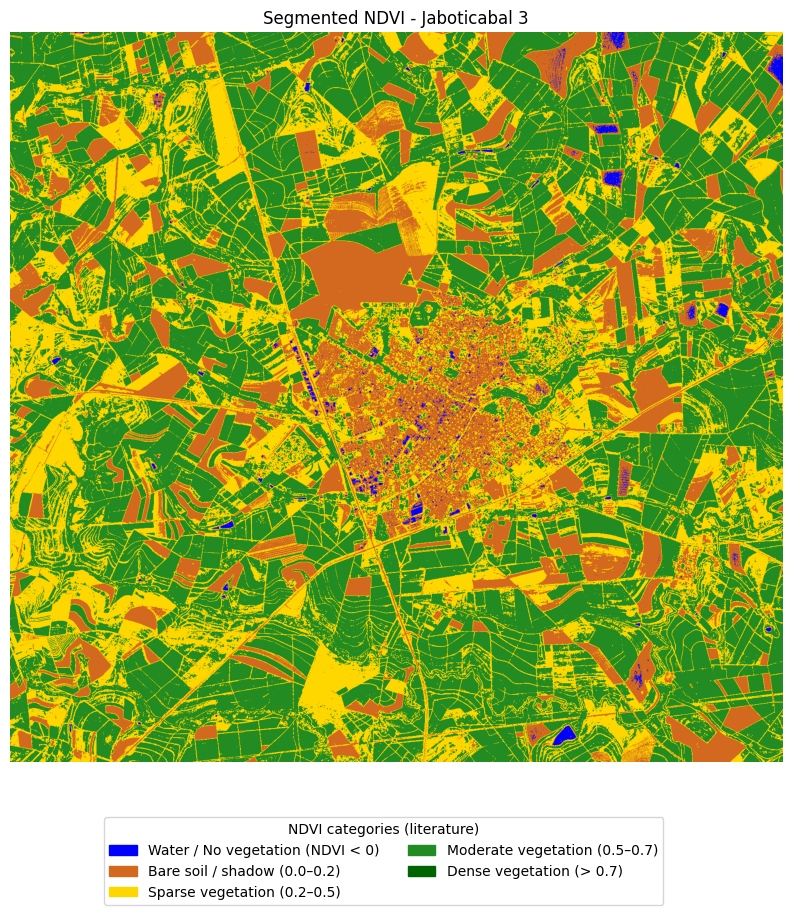

NDVI RGB GeoTIFF saved to: /content/drive/MyDrive/Article Temporal SugarCane/NDVI_Clas_RGB/ndvi_jaboticabal3_segmented.tif
NDVI EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/NDVI_Clas_RGB/ndvi_jaboticabal3_segmented.eps


In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from google.colab import drive

# === Mount Google Drive
drive.mount('/content/drive')

# === Paths
input_ndvi = "/content/ndvi_jaboticabal3.tif"
output_folder = f"{drive_path}/NDVI_Clas_RGB"
os.makedirs(output_folder, exist_ok=True)

# === RGB colors for NDVI classes (based on literature)
colors = [
    [0, 0, 255],       # Class 0 - Deep Blue (NDVI < 0)
    [210, 105, 30],    # Class 1 - Brown (0.0–0.2)
    [255, 215, 0],     # Class 2 - Yellow (0.2–0.5)
    [34, 139, 34],     # Class 3 - Medium Green (0.5–0.7)
    [0, 100, 0],       # Class 4 - Dark Green (> 0.7)
]

legend_labels = [
    'Water / No vegetation (NDVI < 0)',
    'Bare soil / shadow (0.0–0.2)',
    'Sparse vegetation (0.2–0.5)',
    'Moderate vegetation (0.5–0.7)',
    'Dense vegetation (> 0.7)'
]

legend_patches = [
    mpatches.Patch(color=np.array(color) / 255, label=label)
    for color, label in zip(colors, legend_labels)
]

# === Read NDVI
with rasterio.open(input_ndvi) as src:
    ndvi = src.read(1).astype('float32')
    mask_raster = src.read_masks(1) > 0
    profile = src.profile.copy()

# === Valid mask
valid_mask = (mask_raster) & ~np.isnan(ndvi)

# === Classification
ndvi_class = np.full(ndvi.shape, -1)
ndvi_class[valid_mask & (ndvi < 0.0)] = 0
ndvi_class[valid_mask & (ndvi >= 0.0) & (ndvi < 0.2)] = 1
ndvi_class[valid_mask & (ndvi >= 0.2) & (ndvi < 0.5)] = 2
ndvi_class[valid_mask & (ndvi >= 0.5) & (ndvi < 0.7)] = 3
ndvi_class[valid_mask & (ndvi >= 0.7)] = 4

# === Convert to RGB image
ndvi_rgb = np.full((ndvi.shape[0], ndvi.shape[1], 3), 255, dtype=np.uint8)
for i, color in enumerate(colors):
    ndvi_rgb[ndvi_class == i] = color

# === Display and save EPS
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(ndvi_rgb)
ax.set_title('Segmented NDVI - Jaboticabal 3')
ax.axis('off')
fig.subplots_adjust(bottom=0.15)
fig.legend(
    handles=legend_patches,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.0),
    ncol=2,
    title='NDVI categories (literature)'
)

eps_output_path = os.path.join(output_folder, "ndvi_jaboticabal3_segmented.eps")
plt.savefig(eps_output_path, format='eps', dpi=300)
plt.show()

# === Save as RGB GeoTIFF
profile.update(
    driver='GTiff',
    dtype=rasterio.uint8,
    count=3,
    compress='lzw',
    nodata=None
)

rgb_output_tif = os.path.join(output_folder, "ndvi_jaboticabal3_segmented.tif")
with rasterio.open(rgb_output_tif, 'w', **profile) as dst:
    dst.write(ndvi_rgb[:, :, 0], 1)
    dst.write(ndvi_rgb[:, :, 1], 2)
    dst.write(ndvi_rgb[:, :, 2], 3)

print(f"NDVI RGB GeoTIFF saved to: {rgb_output_tif}")
print(f"NDVI EPS image saved to: {eps_output_path}")


Processing: ndvi_jaboticabal3.tif
Binary mask saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_TESTES_copia/mask_jaboticabal3_retangularidade.tif


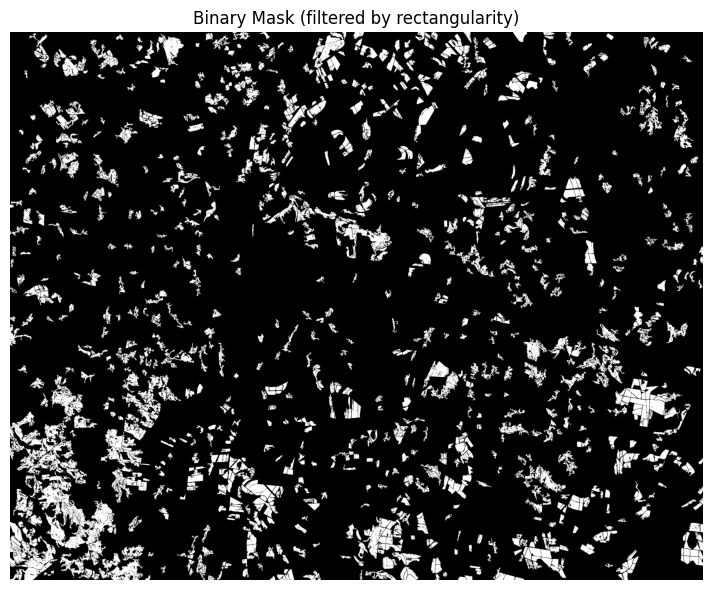

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Estimated total area: 12417.64 hectares
Objects classified as sugarcane (rectangular): 1243


In [ ]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import measure
from google.colab import files  # ⬅️ Importar para download

# === Paths
input_ndvi = "/content/ndvi_jaboticabal3.tif"
output_folder = f"{drive_path}/MASCARAS_BINARIAS_TESTES_copia"
os.makedirs(output_folder, exist_ok=True)

# === Output name
output_name = "mask_jaboticabal3_retangularidade.tif"
output_mask_path = os.path.join(output_folder, output_name)

print(f"Processing: {os.path.basename(input_ndvi)}")

# === Read NDVI
with rasterio.open(input_ndvi) as src:
    ndvi = src.read(1).astype('float32')
    profile = src.profile.copy()
    mask_raster = src.read_masks(1) > 0

# === Threshold NDVI > 0.5
ndvi_threshold = 0.5
dense_vegetation_mask = ((ndvi > ndvi_threshold)) & mask_raster

# === Label connected components
labeled_array, num_features = ndimage.label(dense_vegetation_mask)
props = measure.regionprops(labeled_array)

# === Filter by area and rectangularity
valid_objects = []
min_area_pixels = 300
min_rectangularity = 0.25

for prop in props:
    area = prop.area
    minr, minc, maxr, maxc = prop.bbox
    bbox_area = (maxr - minr) * (maxc - minc)
    if bbox_area == 0:
        continue

    rectangularity = area / bbox_area
    if area >= min_area_pixels and rectangularity > min_rectangularity:
        valid_objects.append(prop.label)

# === Create final mask
sugarcane_mask = np.isin(labeled_array, valid_objects)

# === Update profile and save GeoTIFF
profile.update(
    driver='GTiff',
    dtype=rasterio.uint8,
    count=1,
    compress='lzw',
    nodata=0
)

with rasterio.open(output_mask_path, 'w', **profile) as dst:
    dst.write(sugarcane_mask.astype('uint8'), 1)

print(f"Binary mask saved: {output_mask_path}")

# === Display and save EPS
plt.figure(figsize=(8, 6))
plt.imshow(sugarcane_mask, cmap='gray')
plt.title('Binary Mask (filtered by rectangularity)')
plt.axis('off')
plt.tight_layout()

eps_output_path = os.path.join(output_folder, "mask_jaboticabal3_retangularidade.eps")
plt.savefig(eps_output_path, format='eps', dpi=300)
plt.show()

# ⬇️ Download the EPS
files.download(eps_output_path)

# === Estimate area and count objects
num_pixels = np.sum(sugarcane_mask)
pixel_area_ha = 10 * 10 / 10000  # 10m x 10m = 0.01 ha
area_ha = num_pixels * pixel_area_ha
num_objects = len(valid_objects)

print(f"Estimated total area: {area_ha:.2f} hectares")
print(f"Objects classified as sugarcane (rectangular): {num_objects}")


### Building Dataset


In [ ]:
## Gerando máscaras cana

import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy import ndimage
from skimage import measure
from google.colab import drive

# === 1. Montar o Google Drive
drive.mount('/content/drive')

# === 2. Caminhos
base_path = "/content/cana/cana/cana"
output_folder = "/content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS"
os.makedirs(output_folder, exist_ok=True)

# === 3. Lista de subpastas
subpastas = [p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))]

# === 4. Parâmetros
ndvi_threshold = 0.5
min_area_pixels = 300
min_retangularidade = 0.25

# === 5. Contador de objetos por máscara
objetos_por_mascara = {}

# === 6. Processar cada subpasta
for subpasta in subpastas:
    imagem_path = os.path.join(base_path, subpasta, "3.tif")

    if not os.path.exists(imagem_path):
        print(f"⚠️ Imagem não encontrada em: {imagem_path}")
        continue

    print(f"🟢 Processando: {subpasta}/3.tif")

    with rasterio.open(imagem_path) as src:
        if src.count < 4:
            print("❌ Imagem não tem 4 bandas.")
            continue
        red = src.read(3).astype('float32')
        nir = src.read(4).astype('float32')
        profile = src.profile.copy()
        mask_raster = src.read_masks(1) > 0

    # === Calcular NDVI
    ndvi = (nir - red) / (nir + red + 1e-6)
    ndvi[np.isnan(ndvi)] = -9999
    dense_vegetation_mask = (ndvi > ndvi_threshold) & mask_raster

    # === Rotular objetos
    labeled_array, _ = ndimage.label(dense_vegetation_mask)
    props = measure.regionprops(labeled_array)

    # === Filtrar objetos válidos por retangularidade
    valid_labels = []
    for prop in props:
        area = prop.area
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        if bbox_area == 0:
            continue
        retangularidade = area / bbox_area
        if area > min_area_pixels and retangularidade > min_retangularidade:
            valid_labels.append(prop.label)

    # === Criar máscara final
    final_mask = np.isin(labeled_array, valid_labels)

    # === Salvar máscara no Drive
    profile.update({
        'driver': 'GTiff',
        'dtype': rasterio.uint8,
        'count': 1,
        'compress': 'lzw',
        'nodata': 0
    })

    output_name = f"mask_{subpasta}_3.tif"
    output_path = os.path.join(output_folder, output_name)

    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(final_mask.astype('uint8'), 1)

    # === Registrar número de objetos válidos
    objetos_por_mascara[subpasta] = len(valid_labels)

    print(f"✅ Máscara salva: {output_path}")
    print(f"🔢 Objetos válidos: {len(valid_labels)}\n")

# === 7. Exibir resumo final
print("\n📊 Quantidade de objetos por subpasta:")
for subpasta, qtd in objetos_por_mascara.items():
    print(f"🔹 {subpasta}: {qtd} objetos")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🟢 Processando: piracicaba/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_piracicaba_3.tif
🔢 Objetos válidos: 1241

🟢 Processando: sertaozinho_ribeirao_preto/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_sertaozinho_ribeirao_preto_3.tif
🔢 Objetos válidos: 3603

🟢 Processando: araraquara/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_araraquara_3.tif
🔢 Objetos válidos: 1056

🟢 Processando: jaboticabal/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_jaboticabal_3.tif
🔢 Objetos válidos: 704

🟢 Processando: limeira_araras/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_limeira_araras_3.tif
🔢 Objetos válidos: 6215


📊 Quantid

In [ ]:
# gerando mascaras não cana

import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy import ndimage
from skimage import measure
from google.colab import drive

# === 1. Montar o Google Drive
drive.mount('/content/drive')

# === 2. Caminhos
base_path = "/content/cana/cana/cana"
output_folder = f"{drive_path}/MASCARAS_BINARIAS_NAO_CANA"
os.makedirs(output_folder, exist_ok=True)

# === 3. Lista de subpastas
subpastas = [p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))]

# === 4. Parâmetros
ndvi_threshold = 0.5
min_area_pixels = 300
min_retangularidade = 0.25

# === 5. Processar cada subpasta
for subpasta in subpastas:
    imagem_path = os.path.join(base_path, subpasta, "3.tif")

    if not os.path.exists(imagem_path):
        print(f"⚠️ Imagem não encontrada em: {imagem_path}")
        continue

    print(f"🟢 Processando: {subpasta}/3.tif")

    with rasterio.open(imagem_path) as src:
        if src.count < 4:
            print("❌ Imagem não tem 4 bandas.")
            continue
        red = src.read(3).astype('float32')
        nir = src.read(4).astype('float32')
        profile = src.profile.copy()
        mask_raster = src.read_masks(1) > 0

    # === Calcular NDVI
    ndvi = (nir - red) / (nir + red + 1e-6)
    ndvi[np.isnan(ndvi)] = -9999
    dense_vegetation_mask = (ndvi < ndvi_threshold) & mask_raster

    # === Rotular objetos
    labeled_array, _ = ndimage.label(dense_vegetation_mask)
    props = measure.regionprops(labeled_array)

    # === Filtrar objetos válidos por retangularidade
    valid_labels = []
    for prop in props:
        area = prop.area
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        if bbox_area == 0:
            continue
        retangularidade = area / bbox_area
        valid_labels.append(prop.label)

    # === Criar máscara final
    final_mask = np.isin(labeled_array, valid_labels)

    # === Salvar máscara no Drive
    profile.update({
        'driver': 'GTiff',
        'dtype': rasterio.uint8,
        'count': 1,
        'compress': 'lzw',
        'nodata': 0
    })

    output_name = f"mask_{subpasta}_3.tif"
    output_path = os.path.join(output_folder, output_name)

    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(final_mask.astype('uint8'), 1)

    print(f"✅ Máscara salva: {output_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🟢 Processando: piracicaba/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_piracicaba_3.tif
🟢 Processando: sertaozinho_ribeirao_preto/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_sertaozinho_ribeirao_preto_3.tif
🟢 Processando: araraquara/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_araraquara_3.tif
🟢 Processando: jaboticabal/3.tif
✅ Máscara salva: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS/mask_jaboticabal_3.tif
🟢 Processando: limeira_araras/3.tif


KeyboardInterrupt: 

In [ ]:
# gerando mascaras soja

import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy import ndimage
from skimage import measure
from google.colab import drive

# === 1. Mount Google Drive
drive.mount('/content/drive')

# === 2. Paths
base_path = "/content/soja/soja"
output_folder = f"{drive_path}/MASCARAS_BINARIAS_SOJA"
os.makedirs(output_folder, exist_ok=True)

# === 3. List of subfolders
subfolders = [p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))]

# === 4. Parameters
ndvi_threshold = 0.5


# === 5. Process each subfolder
for subfolder in subfolders:
    image_path = os.path.join(base_path, subfolder, "3.tif")

    if not os.path.exists(image_path):
        print(f"Image not found at: {image_path}")
        continue

    print(f"Processing: {subfolder}/3.tif")

    with rasterio.open(image_path) as src:
        if src.count < 4:
            print("Image does not have 4 bands.")
            continue
        red = src.read(3).astype('float32')
        nir = src.read(4).astype('float32')
        profile = src.profile.copy()
        mask_raster = src.read_masks(1) > 0

    # === Compute NDVI
    ndvi = (nir - red) / (nir + red + 1e-6)
    ndvi[np.isnan(ndvi)] = -9999
    dense_vegetation_mask = ((ndvi > 0.15) & (ndvi < ndvi_threshold)) & mask_raster

    # === Label connected regions
    labeled_array, _ = ndimage.label(dense_vegetation_mask)
    props = measure.regionprops(labeled_array)

    # === Filter valid objects by rectangularity
    valid_labels = []
    for prop in props:
        area = prop.area
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        if bbox_area == 0:
            continue
        rectangularity = area / bbox_area
        valid_labels.append(prop.label)

    # === Create final mask
    final_mask = np.isin(labeled_array, valid_labels)

    # === Save mask as GeoTIFF
    profile.update({
        'driver': 'GTiff',
        'dtype': rasterio.uint8,
        'count': 1,
        'compress': 'lzw',
        'nodata': 0
    })

    output_tif_name = f"mask_{subfolder}_3.tif"
    output_tif_path = os.path.join(output_folder, output_tif_name)

    with rasterio.open(output_tif_path, 'w', **profile) as dst:
        dst.write(final_mask.astype('uint8'), 1)

    print(f"Mask saved as GeoTIFF: {output_tif_path}")

    # === Save EPS visualization
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(final_mask, cmap='gray')
    ax.set_title(f"Binary Mask – {subfolder}")
    ax.axis('off')
    plt.tight_layout()

    output_eps_name = f"mask_{subfolder}_3.eps"
    output_eps_path = os.path.join(output_folder, output_eps_name)
    plt.savefig(output_eps_path, format='eps', dpi=300)
    plt.close()

    print(f"EPS image saved: {output_eps_path}")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Processing: lucas_rio_verde/3.tif
Mask saved as GeoTIFF: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_lucas_rio_verde_3.tif
EPS image saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_lucas_rio_verde_3.eps
Processing: luis_eduardo_magalhaes/3.tif
Mask saved as GeoTIFF: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_luis_eduardo_magalhaes_3.tif
EPS image saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_luis_eduardo_magalhaes_3.eps
Processing: barreiras/3.tif
Mask saved as GeoTIFF: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_barreiras_3.tif
EPS image saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_SOJA/mask_barreiras_3.eps


In [ ]:


!pip install rasterio
import os
import rasterio
import numpy as np
import pandas as pd
import re
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')


print(drive_path)
# 2. Paths
image_base_path = "/content/cana/cana/cana"
mask_base_path = f"{drive_path}/MASCARAS_BINARIAS"
output_csv = f"{drive_path}/dataset_cana2.csv"

# 3. Image control
image_limit = None

# 4. Utility function
def extract_number(name):
    numbers = re.findall(r'\d+', name)
    return int(numbers[0]) if numbers else float('inf')

# 5. Subfolders
subfolders = sorted([p for p in os.listdir(image_base_path) if os.path.isdir(os.path.join(image_base_path, p))])
df_final = pd.DataFrame()
global_id_counter = 100000

# 6. Loop through each subfolder
for subfolder in subfolders:
    print(f"\nProcessing folder: {subfolder}")
    subfolder_path = os.path.join(image_base_path, subfolder)
    image_files = sorted(
        [f for f in os.listdir(subfolder_path) if f.endswith('.tif')], key=extract_number
    )

    if image_limit is not None:
        image_files = image_files[:image_limit]

    # === Read binary mask (only .tif)
    mask_name = f"mask_{subfolder}_3.tif"
    mask_path = os.path.join(mask_base_path, mask_name)
    if not os.path.exists(mask_path):
        print(f"Mask not found for: {subfolder}")
        continue

    with rasterio.open(mask_path) as msk:
        mask_array = msk.read(1)
        sugarcane_mask = mask_array == 1

    # === Label objects
    labeled_array, _ = ndimage.label(sugarcane_mask)
    props_ref = measure.regionprops(labeled_array)

    # === Map: id + coords + rectangularity
    object_map = {}
    for prop in props_ref:
        if len(prop.coords) < 5:
            continue
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        area = prop.area
        rectangularity = area / bbox_area if bbox_area > 0 else 0
        object_map[prop.label] = {
            'coords': prop.coords,
            'global_id': global_id_counter,
            'rectangularity': rectangularity
        }
        global_id_counter += 1

    # === Loop through each image in the sequence
    for image_name in image_files:
        image_path = os.path.join(subfolder_path, image_name)
        with rasterio.open(image_path) as src:
            red = src.read(3).astype("float32")
            nir = src.read(4).astype("float32")
            blue = src.read(1).astype("float32")

        # === Spectral indices
        mask_invalid = (red == 0) | (nir == 0)
        ndvi = (nir - red) / (nir + red + 1e-6)
        evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
        msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

        ndvi[mask_invalid] = np.nan
        evi[mask_invalid] = np.nan
        msavi[mask_invalid] = np.nan

        # === Normalize NDVI
        ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
        ndvi_norm[np.isnan(ndvi)] = 0

        # === Compute object-wise metrics
        for obj in object_map.values():
            coords = np.array(obj['coords'])
            global_id = obj['global_id']
            rectangularity = obj['rectangularity']

            ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
            evi_vals = evi[coords[:, 0], coords[:, 1]]
            msavi_vals = msavi[coords[:, 0], coords[:, 1]]
            patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

            patch_img = np.zeros(ndvi.shape, dtype=np.uint8)
            patch_img[coords[:, 0], coords[:, 1]] = patch_vals

            glcm = graycomatrix(patch_img, distances=[1], angles=[0], symmetric=True, normed=True)
            contrast = graycoprops(glcm, 'contrast')[0, 0]
            dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
            homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
            energy = graycoprops(glcm, 'energy')[0, 0]
            correlation = graycoprops(glcm, 'correlation')[0, 0]

            area = len(coords) * 100  # 10m x 10m per pixel = 100 m²

            df_final = pd.concat([df_final, pd.DataFrame({
                "subfolder": [subfolder],
                "image": [image_name],
                "object_id": [global_id],
                "area_m2": [area],
                "rectangularity": [rectangularity],
                "mean_ndvi": [np.nanmean(ndvi_vals)],
                "mean_evi": [np.nanmean(evi_vals)],
                "mean_msavi": [np.nanmean(msavi_vals)],
                "glcm_contrast": [contrast],
                "glcm_dissimilarity": [dissimilarity],
                "glcm_homogeneity": [homogeneity],
                "glcm_energy": [energy],
                "glcm_correlation": [correlation],
                "class": ["sugarcane"]
            })], ignore_index=True)

# 7. Export CSV
df_final = df_final.sort_values(by=["object_id", "image"])
df_final.to_csv(output_csv, index=False)
print(f"\nCSV generated with {len(df_final)} records: {output_csv}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 92.9 MB/s eta 0:00:00
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Article Temporal SugarCane

Processing folder: araraquara

Processing folder: jaboticabal


/tmp/ipython-input-3-676824903.py:96: RuntimeWarning: invalid value encountered in cast
  ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)



Processing folder: limeira_araras

Processing folder: piracicaba

Processing folder: sertaozinho_ribeirao_preto

CSV generated with 102552 records: /content/drive/MyDrive/Article Temporal SugarCane/dataset_cana2.csv


In [ ]:
df_final.head()

,subfolder,image,object_id,area_m2,rectangularity,mean_ndvi,mean_evi,mean_msavi,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,class
231,araraquara,10.tif,100000,448025000,0.602075,0.247618,3176.215088,0.376954,2053.855956,15.531401,0.492834,0.363461,0.827446,sugarcane
0,araraquara,3.tif,100000,448025000,0.602075,0.319176,3921.007812,0.460809,2704.453362,17.989224,0.483266,0.363747,0.804541,sugarcane
33,araraquara,4.tif,100000,448025000,0.602075,0.325821,405.405334,0.469317,2675.205786,17.750296,0.483466,0.363584,0.814153,sugarcane
66,araraquara,5.tif,100000,448025000,0.602075,0.286937,1637.751343,0.424771,2241.295785,16.217918,0.488726,0.363493,0.820735,sugarcane
99,araraquara,6.tif,100000,448025000,0.602075,0.265922,3287.839600,0.398047,2000.774688,15.232856,0.500350,0.363532,0.824354,sugarcane


In [ ]:
import pandas as pd

# Caminho do CSV
caminho_csv = '/content/drive/MyDrive/Article Temporal SugarCane/dataset_cana2.csv'

# Carregar o arquivo
df = pd.read_csv(caminho_csv)

# Contar a quantidade de objetos únicos por subfolder
objetos_por_subfolder = df.groupby('subfolder')['object_id'].nunique()

print("Quantidade de objetos por subfolder:")
print(objetos_por_subfolder)



Quantidade de objetos por subfolder:
subfolder
araraquara                    1056
jaboticabal                    704
limeira_araras                6215
piracicaba                    1241
sertaozinho_ribeirao_preto    3603
Name: object_id, dtype: int64


In [ ]:
import pandas as pd
import re

# Load the existing CSV
df = pd.read_csv(f"{drive_path}/dataset_cana.csv")

# Function to extract the number from the image name (e.g., 3.tif → 3)
def extract_image_number(name):
    numbers = re.findall(r'\d+', str(name))
    return int(numbers[0]) if numbers else float('inf')

# Apply correct ordering
df["image_num"] = df["image"].apply(extract_image_number)
df_sorted = df.sort_values(by=["object_id", "image_num"]).drop(columns=["image_num"])

# (Optional) Save the sorted CSV
df_sorted.to_csv(f"{drive_path}/dataset_cana_ordenado.csv", index=False)

# Show the first rows of the sorted dataset
print(df_sorted.head(20))





     subfolder   image  object_id  area_m2  rectangularity  mean_ndvi  \
1   araraquara   3.tif          1   207300        0.648623   0.546542   
2   araraquara   4.tif          1   207300        0.648623   0.541004   
3   araraquara   5.tif          1   207300        0.648623   0.513106   
4   araraquara   6.tif          1   207300        0.648623   0.510312   
5   araraquara   7.tif          1   207300        0.648623   0.504631   
6   araraquara   8.tif          1   207300        0.648623   0.237151   
7   araraquara   9.tif          1   207300        0.648623   0.216455   
0   araraquara  10.tif          1   207300        0.648623   0.358624   
9   araraquara   3.tif          2    92300        0.275687   0.546459   
10  araraquara   4.tif          2    92300        0.275687   0.550324   
11  araraquara   5.tif          2    92300        0.275687   0.490749   
12  araraquara   6.tif          2    92300        0.275687   0.454009   
13  araraquara   7.tif          2    92300        0

In [ ]:
!pip install rasterio

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy import ndimage
from skimage import measure
from google.colab import drive

# === 1. Mount Google Drive
drive.mount('/content/drive')

# === 2. Paths
base_path = "/content/cana/cana"
output_folder = f"{drive_path}/MASCARAS_BINARIAS_NAO_CANA"
os.makedirs(output_folder, exist_ok=True)

# === 3. List subfolders
subfolders = [p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))]

# === 4. NDVI threshold for "non-cane"
ndvi_threshold = 0.5  # values below this will be considered "non-cane"

# === 5. Process each subfolder
for subfolder in subfolders:
    image_path = os.path.join(base_path, subfolder, "3.tif")

    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        continue

    print(f"Processing: {subfolder}/3.tif")

    with rasterio.open(image_path) as src:
        if src.count < 4:
            print("Image does not have 4 bands.")
            continue
        red = src.read(3).astype('float32')
        nir = src.read(4).astype('float32')
        profile = src.profile.copy()
        mask_raster = src.read_masks(1) > 0

    # === Compute NDVI
    ndvi = (nir - red) / (nir + red + 1e-6)
    ndvi[np.isnan(ndvi)] = -9999

    # === Create "non-cane" mask
    non_cane_mask = (ndvi < ndvi_threshold) & mask_raster

    # === Label connected objects (for consistency only)
    labeled_array, _ = ndimage.label(non_cane_mask)
    final_mask = labeled_array > 0  # include all non-zero labels

    # === Save binary mask as GeoTIFF
    profile.update({
        'driver': 'GTiff',
        'dtype': rasterio.uint8,
        'count': 1,
        'compress': 'lzw',
        'nodata': 0
    })

    mask_name_tif = f"mask_non_cane_{subfolder}_3.tif"
    tif_path = os.path.join(output_folder, mask_name_tif)

    with rasterio.open(tif_path, 'w', **profile) as dst:
        dst.write(final_mask.astype('uint8'), 1)

    print(f"Non-cane mask saved: {tif_path}")

    # === Save visualization (PNG and EPS)
    fig, ax = plt.subplots(figsize=(3, 3))
    ax.imshow(final_mask, cmap='gray')
    ax.set_title(f'{subfolder} - Non-Cane')
    ax.axis('off')
    plt.tight_layout()

    eps_path = os.path.join(output_folder, f"mask_non_cane_{subfolder}_3.eps")
    png_path = os.path.join(output_folder, f"mask_non_cane_{subfolder}_3.png")
    plt.savefig(eps_path, format='eps', dpi=300)
    plt.savefig(png_path, format='png', dpi=300)
    plt.close()

    print(f"Image saved: {eps_path} and {png_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Processing: piracicaba/3.tif
Non-cane mask saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_piracicaba_3.tif
Image saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_piracicaba_3.eps and /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_piracicaba_3.png
Processing: araraquara/3.tif
Non-cane mask saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_araraquara_3.tif
Image saved: /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_araraquara_3.eps and /content/drive/MyDrive/Article Temporal SugarCane/MASCARAS_BINARIAS_NAO_CANA/mask_non_cane_araraquara_3.png
Processing: jaboticabal/3.tif
Non-cane mask saved: /content/drive/MyDrive/Article Tempora

In [ ]:
import os
import rasterio
import numpy as np
import pandas as pd
import re
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Paths
image_base_path = "/content/cana/cana"
mask_base_path = f"{drive_path}/MASCARAS_BINARIAS_NAO_CANA"
output_csv = f"{drive_path}/dataset_outros.csv"

# 3. Image limit
image_limit = None

# 4. Utility function
def extract_number(name):
    numbers = re.findall(r'\d+', name)
    return int(numbers[0]) if numbers else float('inf')

# 5. Subfolders
subfolders = sorted([p for p in os.listdir(image_base_path) if os.path.isdir(os.path.join(image_base_path, p))])
df_final = pd.DataFrame()
global_id_counter = global_id_counter + 1

# 6. Loop through each subfolder
for subfolder in subfolders:
    print(f"\nProcessing folder: {subfolder}")
    subfolder_path = os.path.join(image_base_path, subfolder)
    tif_files = sorted([f for f in os.listdir(subfolder_path) if f.endswith('.tif')], key=extract_number)

    if image_limit is not None:
        tif_files = tif_files[:image_limit]

    # === Open non-cane mask
    mask_name = f"mask_non_cane_{subfolder}_3.tif"
    mask_path = os.path.join(mask_base_path, mask_name)
    if not os.path.exists(mask_path):
        print(f"Mask not found for {subfolder}")
        continue

    with rasterio.open(mask_path) as msk:
        mask_array = msk.read(1)
        non_cane_mask = mask_array == 1

    # === Label objects
    labeled_array, _ = ndimage.label(non_cane_mask)
    props_ref = measure.regionprops(labeled_array)

    # === Object mapping
    object_map = {}
    for prop in props_ref:
        if len(prop.coords) < 5:
            continue
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        area = prop.area
        rectangularity = area / bbox_area if bbox_area > 0 else 0
        object_map[prop.label] = {
            'coords': prop.coords,
            'global_id': global_id_counter,
            'rectangularity': rectangularity
        }
        global_id_counter += 1

    # === Loop through images
    for image_name in tif_files:
        image_path = os.path.join(subfolder_path, image_name)
        with rasterio.open(image_path) as src:
            red = src.read(3).astype("float32")
            nir = src.read(4).astype("float32")
            blue = src.read(1).astype("float32")

        # === Spectral indices
        mask_invalid = (red == 0) | (nir == 0)
        ndvi = (nir - red) / (nir + red + 1e-6)
        evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
        msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

        ndvi[mask_invalid] = np.nan
        evi[mask_invalid] = np.nan
        msavi[mask_invalid] = np.nan

        # === Normalize NDVI for GLCM texture
        ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
        ndvi_norm[np.isnan(ndvi)] = 0

        # === Metrics by object
        for obj in object_map.values():
            coords = np.array(obj['coords'])
            global_id = obj['global_id']
            rectangularity = obj['rectangularity']

            ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
            evi_vals = evi[coords[:, 0], coords[:, 1]]
            msavi_vals = msavi[coords[:, 0], coords[:, 1]]
            patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

            patch_img = np.zeros(ndvi.shape, dtype=np.uint8)
            patch_img[coords[:, 0], coords[:, 1]] = patch_vals

            glcm = graycomatrix(patch_img, distances=[1], angles=[0], symmetric=True, normed=True)
            contrast = graycoprops(glcm, 'contrast')[0, 0]
            dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
            homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
            energy = graycoprops(glcm, 'energy')[0, 0]
            correlation = graycoprops(glcm, 'correlation')[0, 0]

            area = len(coords) * 100

            df_final = pd.concat([df_final, pd.DataFrame({
                "subfolder": [subfolder],
                "image": [image_name],
                "object_id": [global_id],
                "area_m2": [area],
                "rectangularity": [rectangularity],
                "mean_ndvi": [np.nanmean(ndvi_vals)],
                "mean_evi": [np.nanmean(evi_vals)],
                "mean_msavi": [np.nanmean(msavi_vals)],
                "glcm_contrast": [contrast],
                "glcm_dissimilarity": [dissimilarity],
                "glcm_homogeneity": [homogeneity],
                "glcm_energy": [energy],
                "glcm_correlation": [correlation],
                "class": ["OTHERS"]
            })], ignore_index=True)

# 7. Export CSV
df_final = df_final.sort_values(by=["object_id", "image"])
df_final.to_csv(output_csv, index=False)
print(f"\nCSV generated with {len(df_final)} records: {output_csv}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Processing folder: araraquara

Processing folder: jaboticabal


/tmp/ipython-input-21-3149013619.py:91: RuntimeWarning: invalid value encountered in cast
  ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)



Processing folder: piracicaba

Processing folder: sertaozinho_ribeirao_preto

CSV generated with 235280 records: /content/drive/MyDrive/Article Temporal SugarCane/dataset_outros.csv


In [ ]:
import pandas as pd

# Caminho do arquivo
caminho_csv = f"{drive_path}/dataset_soja.csv"  # ajuste se necessário

# Ler o CSV
df = pd.read_csv(caminho_csv)

# Exibir as 10 primeiras linhas
print("📄 Primeiras 10 amostras do dataset:")
print(df.head(10))

📄 Primeiras 10 amostras do dataset:
   subfolder   image  object_id  area_m2  rectangularity  mean_ndvi  mean_evi  \
0  barreiras  10.tif      36015   314000        0.493711   0.339621  1.476414   
1  barreiras   3.tif      36015   314000        0.493711   0.494142  3.099229   
2  barreiras   4.tif      36015   314000        0.493711   0.445350  3.605984   
3  barreiras   5.tif      36015   314000        0.493711   0.470498  3.113136   
4  barreiras   6.tif      36015   314000        0.493711   0.438726  2.506804   
5  barreiras   7.tif      36015   314000        0.493711   0.412284  2.437152   
6  barreiras   8.tif      36015   314000        0.493711   0.366679  1.848933   
7  barreiras   9.tif      36015   314000        0.493711   0.354388  1.711599   
8  barreiras  10.tif      36016   646500        0.412967   0.292555  1.260158   
9  barreiras   3.tif      36016   646500        0.412967   0.500031  3.157466   

   mean_msavi  glcm_contrast  glcm_dissimilarity  glcm_homogeneity  \
0 

In [ ]:
!pip install rasterio

import os
import rasterio
import numpy as np
import pandas as pd
import re
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Paths
image_base_path = "/content/soja/soja"
mask_base_path = f"{drive_path}/MASCARAS_BINARIAS_SOJA"
output_csv = f"{drive_path}/dataset_soja2.csv"

# 3. Image control
image_limit = None

# 4. Utility function
def extract_number(name):
    numbers = re.findall(r'\d+', name)
    return int(numbers[0]) if numbers else float('inf')

# 5. Subfolders
subfolders = sorted([p for p in os.listdir(image_base_path) if os.path.isdir(os.path.join(image_base_path, p))])
df_final = pd.DataFrame()
#global_id_counter = global_id_counter + 1
global_id_counter = 36015

# 6. Loop through each subfolder
for subfolder in subfolders:
    print(f"\nProcessing folder: {subfolder}")
    subfolder_path = os.path.join(image_base_path, subfolder)
    tif_files = sorted([f for f in os.listdir(subfolder_path) if f.endswith('.tif')], key=extract_number)

    if image_limit is not None:
        tif_files = tif_files[:image_limit]

    # === Open soybean mask
    mask_name = f"mask_{subfolder}_3.tif"
    mask_path = os.path.join(mask_base_path, mask_name)
    if not os.path.exists(mask_path):
        print(f"Mask not found for {subfolder}")
        continue

    with rasterio.open(mask_path) as msk:
        mask_array = msk.read(1)
        soybean_mask = mask_array == 1

    # === Label objects
    labeled_array, _ = ndimage.label(soybean_mask)
    props_ref = measure.regionprops(labeled_array)

    # === Object mapping
    object_map = {}
    for prop in props_ref:
        if len(prop.coords) < 5:
            continue
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        area = prop.area
        rectangularity = area / bbox_area if bbox_area > 0 else 0
        object_map[prop.label] = {
            'coords': prop.coords,
            'global_id': global_id_counter,
            'rectangularity': rectangularity
        }
        global_id_counter += 1

    # === Loop through images
    for image_name in tif_files:
        image_path = os.path.join(subfolder_path, image_name)
        with rasterio.open(image_path) as src:
            red = src.read(3).astype("float32")
            nir = src.read(4).astype("float32")
            blue = src.read(1).astype("float32")

        # === Spectral indices
        invalid_mask = (red == 0) | (nir == 0)
        ndvi = (nir - red) / (nir + red + 1e-6)
        evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
        msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

        ndvi[invalid_mask] = np.nan
        evi[invalid_mask] = np.nan
        msavi[invalid_mask] = np.nan

        # === Normalize NDVI for GLCM
        ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
        ndvi_norm[np.isnan(ndvi)] = 0

        # === Metrics by object
        for obj in object_map.values():
            coords = np.array(obj['coords'])
            global_id = obj['global_id']
            rectangularity = obj['rectangularity']

            ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
            evi_vals = evi[coords[:, 0], coords[:, 1]]
            msavi_vals = msavi[coords[:, 0], coords[:, 1]]
            patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

            patch_img = np.zeros(ndvi.shape, dtype=np.uint8)
            patch_img[coords[:, 0], coords[:, 1]] = patch_vals

            glcm = graycomatrix(patch_img, distances=[1], angles=[0], symmetric=True, normed=True)
            contrast = graycoprops(glcm, 'contrast')[0, 0]
            dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
            homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
            energy = graycoprops(glcm, 'energy')[0, 0]
            correlation = graycoprops(glcm, 'correlation')[0, 0]

            area = len(coords) * 100  # each pixel = 10m x 10m = 100 m²

            df_final = pd.concat([df_final, pd.DataFrame({
                "subfolder": [subfolder],
                "image": [image_name],
                "object_id": [global_id],
                "area_m2": [area],
                "rectangularity": [rectangularity],
                "mean_ndvi": [np.nanmean(ndvi_vals)],
                "mean_evi": [np.nanmean(evi_vals)],
                "mean_msavi": [np.nanmean(msavi_vals)],
                "glcm_contrast": [contrast],
                "glcm_dissimilarity": [dissimilarity],
                "glcm_homogeneity": [homogeneity],
                "glcm_energy": [energy],
                "glcm_correlation": [correlation],
                "class": ["SOYBEAN"]
            })], ignore_index=True)

# 7. Export CSV
df_final = df_final.sort_values(by=["object_id", "image"])
df_final.to_csv(output_csv, index=False)
print(f"\nCSV generated with {len(df_final)} records: {output_csv}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Processing folder: barreiras

Processing folder: lucas_rio_verde


/tmp/ipython-input-41-3964210178.py:94: RuntimeWarning: invalid value encountered in cast
  ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)



Processing folder: luis_eduardo_magalhaes

CSV generated with 136000 records: /content/drive/MyDrive/Article Temporal SugarCane/dataset_soja2.csv


In [ ]:
import pandas as pd
import re

# Load the existing CSV
df = pd.read_csv(f"{drive_path}/dataset_outros.csv")

# Function to extract the number from the image name (e.g., 3.tif → 3)
def extract_image_number(name):
    numbers = re.findall(r'\d+', str(name))
    return int(numbers[0]) if numbers else float('inf')

# Apply correct sorting
df["image_num"] = df["image"].apply(extract_image_number)
df_sorted = df.sort_values(by=["object_id", "image_num"]).drop(columns=["image_num"])

# (Optional) Save the sorted CSV again
df_sorted.to_csv(f"{drive_path}/dataset_outros_ordenado.csv", index=False)

# Display the first 20 sorted rows
print(df_sorted.head(20))


     subfolder   image  object_id    area_m2  rectangularity  mean_ndvi  \
1   araraquara   3.tif       6605  448025000        0.602075   0.319176   
2   araraquara   4.tif       6605  448025000        0.602075   0.325821   
3   araraquara   5.tif       6605  448025000        0.602075   0.286937   
4   araraquara   6.tif       6605  448025000        0.602075   0.265922   
5   araraquara   7.tif       6605  448025000        0.602075   0.263251   
6   araraquara   8.tif       6605  448025000        0.602075   0.220999   
7   araraquara   9.tif       6605  448025000        0.602075   0.216726   
0   araraquara  10.tif       6605  448025000        0.602075   0.247618   
9   araraquara   3.tif       6606       6500        0.123340   0.440995   
10  araraquara   4.tif       6606       6500        0.123340   0.445683   
11  araraquara   5.tif       6606       6500        0.123340   0.423919   
12  araraquara   6.tif       6606       6500        0.123340   0.400919   
13  araraquara   7.tif   

In [ ]:
import pandas as pd

# Path to your CSV file
csv_path = f'{drive_path}/dataset_outros_ordenado.csv'

# Load the dataset
df = pd.read_csv(csv_path)

global_id_counter = df["object_id"].iloc[-1]
print("Last objeto_global_id:", global_id_counter)


Last objeto_global_id: 36014


In [ ]:
df_final.head()

,subfolder,image,object_id,area_m2,rectangularity,mean_ndvi,mean_evi,mean_msavi,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,class
4585,barreiras,10.tif,36015,314000,0.493711,0.339621,1.476414,0.506327,1.122620,0.007475,0.999775,0.999712,0.924091,SOYBEAN
0,barreiras,3.tif,36015,314000,0.493711,0.494142,3.099229,0.661379,1.641009,0.008469,0.999815,0.999712,0.927411,SOYBEAN
655,barreiras,4.tif,36015,314000,0.493711,0.445350,3.605984,0.613868,1.462500,0.008188,0.999800,0.999712,0.929741,SOYBEAN
1310,barreiras,5.tif,36015,314000,0.493711,0.470498,3.113136,0.639855,1.557769,0.008269,0.999815,0.999712,0.927289,SOYBEAN
1965,barreiras,6.tif,36015,314000,0.493711,0.438726,2.506804,0.609792,1.475905,0.008156,0.999801,0.999712,0.927110,SOYBEAN


In [ ]:
import pandas as pd
import re

# Load the existing CSV
df = pd.read_csv(f"{drive_path}/dataset_cana2.csv")

# Function to extract the number from the image name (e.g., 3.tif → 3)
def extract_image_number(name):
    numbers = re.findall(r'\d+', str(name))
    return int(numbers[0]) if numbers else float('inf')

# Apply proper sorting
df["image_num"] = df["image"].apply(extract_image_number)
df_sorted = df.sort_values(by=["object_id", "image_num"]).drop(columns=["image_num"])

# (Optional) Save the sorted CSV again
df_sorted.to_csv(f"{drive_path}/dataset_cana2_ordenado.csv", index=False)

# Display the first 20 sorted rows
print(df_sorted.head(20))


     subfolder   image  object_id  area_m2  rectangularity  mean_ndvi  \
1   araraquara   3.tif     100000   207300        0.648623   0.546542   
2   araraquara   4.tif     100000   207300        0.648623   0.541004   
3   araraquara   5.tif     100000   207300        0.648623   0.513106   
4   araraquara   6.tif     100000   207300        0.648623   0.510312   
5   araraquara   7.tif     100000   207300        0.648623   0.504631   
6   araraquara   8.tif     100000   207300        0.648623   0.237151   
7   araraquara   9.tif     100000   207300        0.648623   0.216455   
0   araraquara  10.tif     100000   207300        0.648623   0.358624   
9   araraquara   3.tif     100001    92300        0.275687   0.546459   
10  araraquara   4.tif     100001    92300        0.275687   0.550324   
11  araraquara   5.tif     100001    92300        0.275687   0.490749   
12  araraquara   6.tif     100001    92300        0.275687   0.454009   
13  araraquara   7.tif     100001    92300        0

In [ ]:
import pandas as pd

# File paths
path_soy = f'{drive_path}/dataset_soja2_ordenado.csv'
path_sugarcane = f'{drive_path}/dataset_cana2_ordenado.csv'
path_others = f'{drive_path}/dataset_outros_ordenado.csv'

# Load datasets
df_soy = pd.read_csv(path_soy)
df_sugarcane = pd.read_csv(path_sugarcane)
df_others = pd.read_csv(path_others)

# Concatenate all datasets
df_combined = pd.concat([df_sugarcane, df_others, df_soy], ignore_index=True)

# Optional: sort by object ID or image name
# df_combined = df_combined.sort_values(by=['object_id', 'image'])

# Output path
output_path = f'{drive_path}/dataset_unificado.csv'

# Save to CSV
df_combined.to_csv(output_path, index=False)

print(f"Unified dataset saved to: {output_path}")


Unified dataset saved to: /content/drive/MyDrive/Article Temporal SugarCane/dataset_unificado.csv


In [ ]:
df_combined.head(20)

,subfolder,image,object_id,area_m2,rectangularity,mean_ndvi,mean_evi,mean_msavi,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,class
0,araraquara,3.tif,1,207300,0.648623,0.546542,3.202826,0.706617,1.115343,0.005974,0.999813,0.999709,0.956076,sugarcane
1,araraquara,4.tif,1,207300,0.648623,0.541004,2.714645,0.701876,1.092994,0.006002,0.999803,0.999709,0.957007,sugarcane
2,araraquara,5.tif,1,207300,0.648623,0.513106,2.375257,0.677464,0.970466,0.005976,0.999788,0.999709,0.958756,sugarcane
3,araraquara,6.tif,1,207300,0.648623,0.510312,2.663553,0.675272,0.957738,0.005836,0.999793,0.999709,0.957291,sugarcane
4,araraquara,7.tif,1,207300,0.648623,0.504631,2.402325,0.670183,1.015781,0.006041,0.999788,0.999709,0.958096,sugarcane
5,araraquara,8.tif,1,207300,0.648623,0.237151,0.850949,0.370969,0.689858,0.004688,0.999838,0.999709,0.948345,sugarcane
6,araraquara,9.tif,1,207300,0.648623,0.216455,0.909973,0.337394,0.619663,0.004468,0.999835,0.999709,0.944032,sugarcane
7,araraquara,10.tif,1,207300,0.648623,0.358624,1.769298,0.520413,0.877157,0.005485,0.999789,0.999709,0.949629,sugarcane
8,araraquara,3.tif,2,92300,0.275687,0.546459,2.997941,0.706335,1.245642,0.006414,0.999887,0.999861,0.889865,sugarcane
9,araraquara,4.tif,2,92300,0.275687,0.550324,2.596599,0.709561,1.285805,0.006445,0.999892,0.999861,0.888700,sugarcane


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


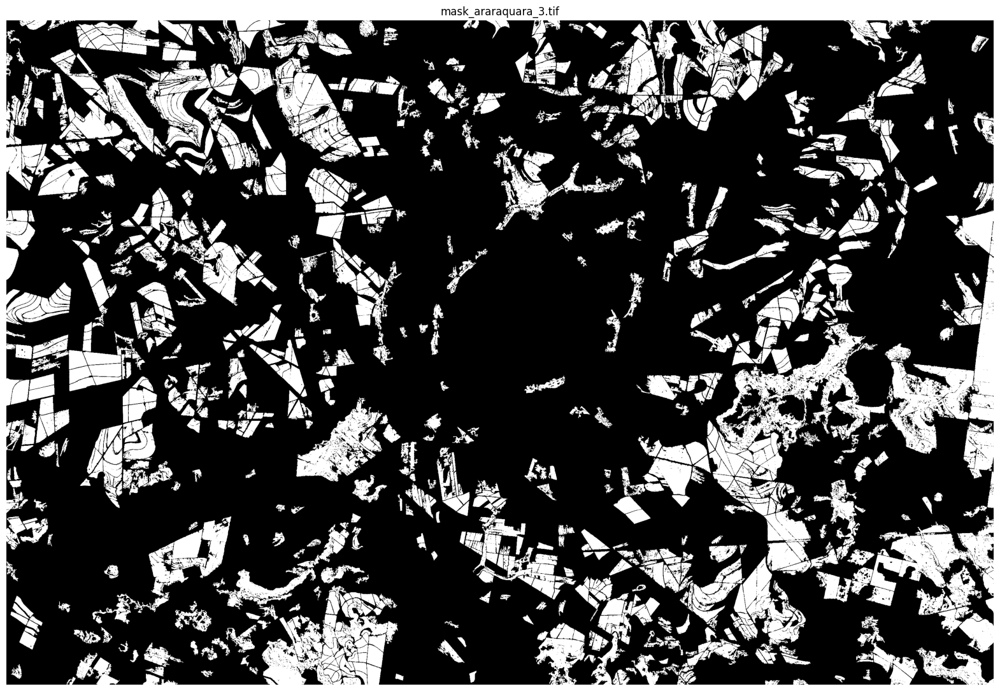

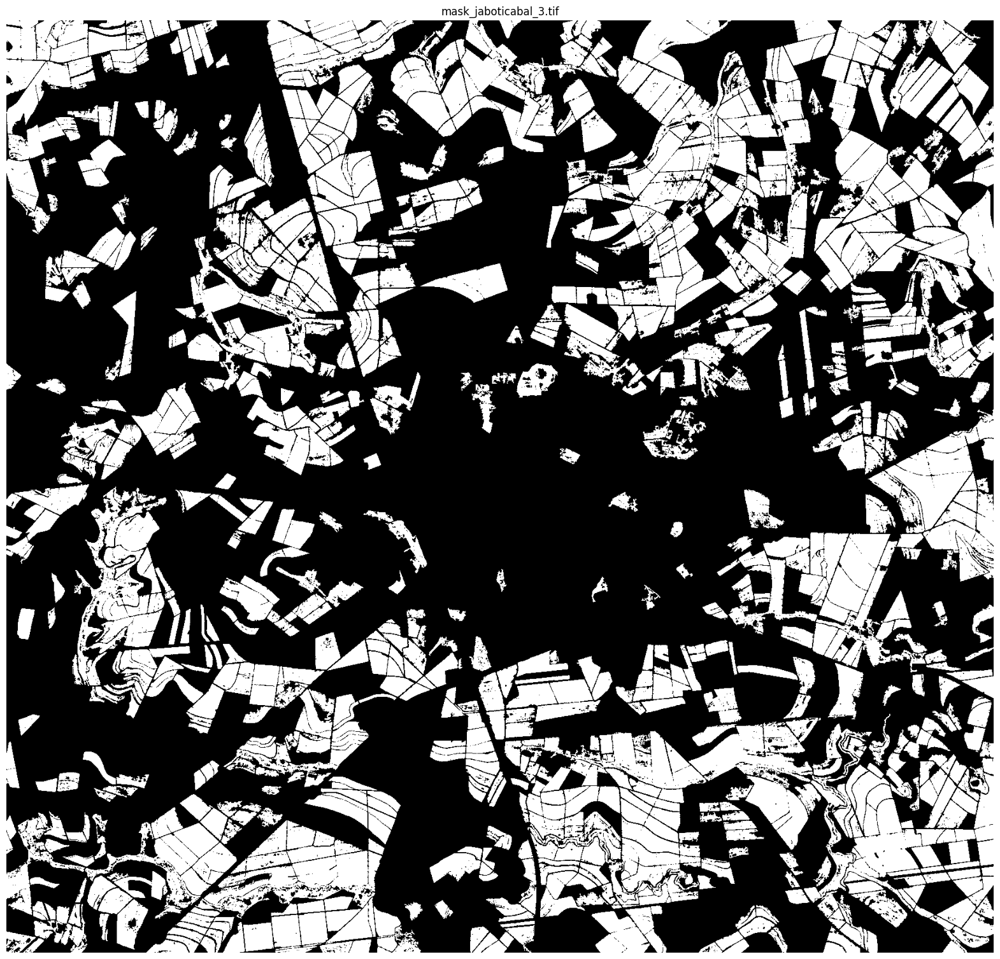

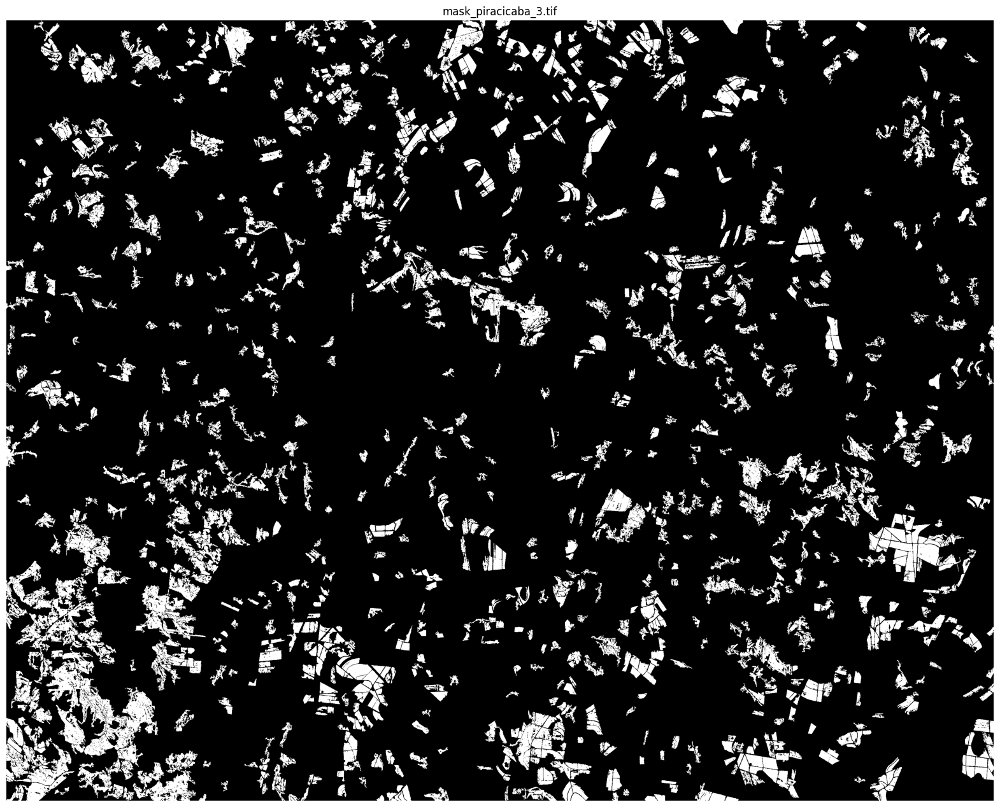

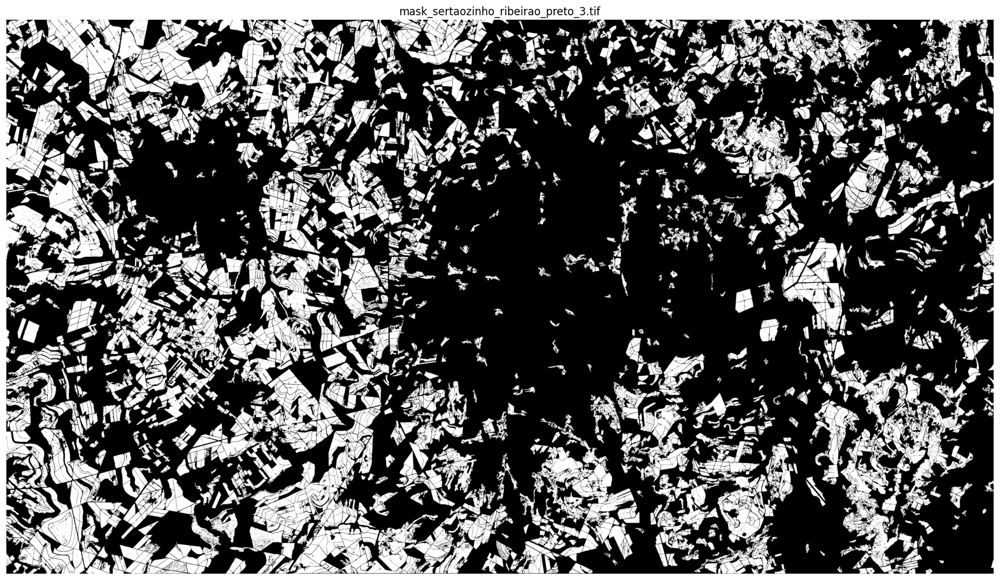

In [ ]:
import os
import matplotlib.pyplot as plt
import rasterio
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Path to the folder containing masks
mask_dir = f"{drive_path}/MASCARAS_BINARIAS"

# 3. List of .tif files
mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.tif')]

# 4. Loop to display each mask
for file_name in sorted(mask_files):
    full_path = os.path.join(mask_dir, file_name)

    with rasterio.open(full_path) as src:
        mask = src.read(1)

    plt.figure(figsize=(20, 20))
    plt.imshow(mask, cmap='gray')
    plt.title(file_name)
    plt.axis('off')
    plt.show()


In [ ]:
import pandas as pd

# Input path
input_path = f'{drive_path}/dataset_unificado.csv'

# Output path
output_path = f'{drive_path}/dataset_unificado_filtrado.csv'

# Load dataset
df = pd.read_csv(input_path)

# Filter (remove 'piracicaba' and 'barreiras')
df_filtered = df[~df['subfolder'].str.contains('jaboticabal|piracicaba', case=False, na=False)]

# Save result
df_filtered.to_csv(output_path, index=False)

print(f"Dataset saved with {len(df_filtered)} records: {output_path}")


Dataset saved with 390856 records: /content/drive/MyDrive/Article Temporal SugarCane/dataset_unificado_filtrado.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

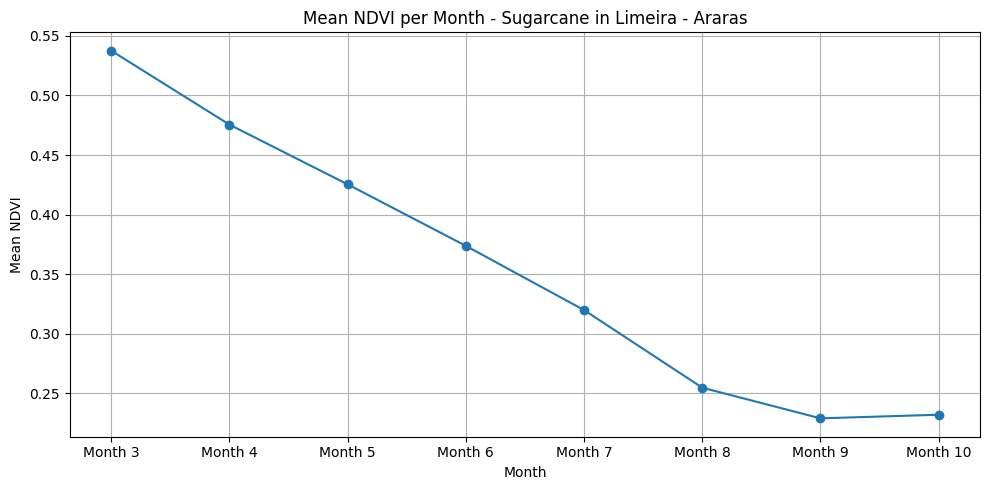

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv(f'{drive_path}/dataset_unificado_filtrado.csv')

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'limeira_araras') & (df['class'] == 'sugarcane')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Sugarcane in Limeira - Araras')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()

# Save as EPS
eps_filename = "figure5.eps"
plt.savefig(eps_filename, format='eps')

# Download the file (if using Google Colab)
files.download(eps_filename)


plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

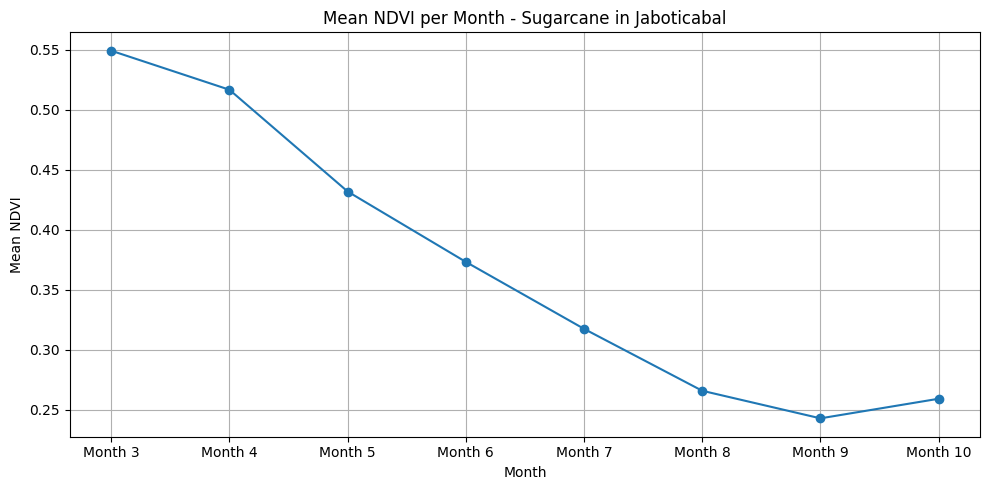

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv(f'{drive_path}/dataset_unificado.csv')

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'jaboticabal') & (df['class'] == 'sugarcane')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Sugarcane in Jaboticabal')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()


eps_filename = "figure6.eps"
plt.savefig(eps_filename, format='eps')

# Download the file (if using Google Colab)
files.download(eps_filename)


plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

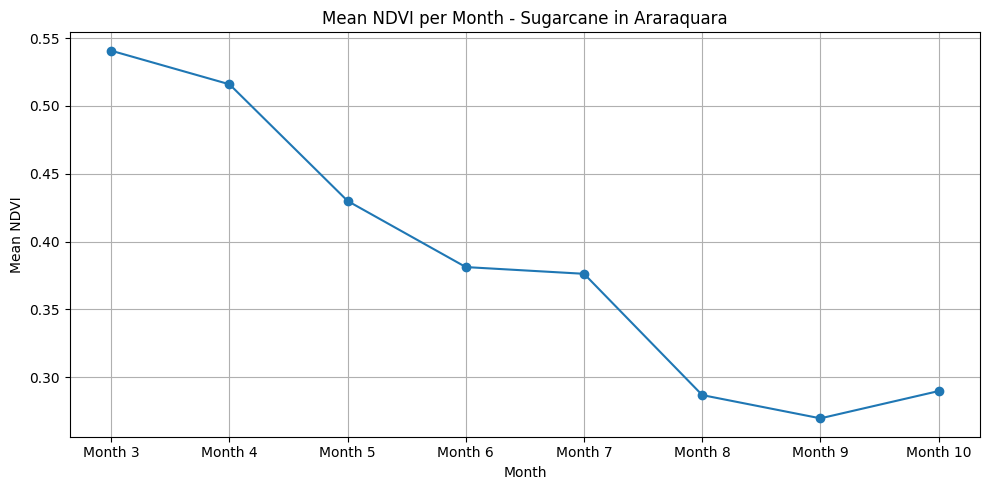

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv(f'{drive_path}/dataset_unificado_filtrado.csv')

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'araraquara') & (df['class'] == 'sugarcane')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Sugarcane in Araraquara')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()


eps_filename = "figure7.eps"
plt.savefig(eps_filename, format='eps')

# Download the file (if using Google Colab)
files.download(eps_filename)

plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

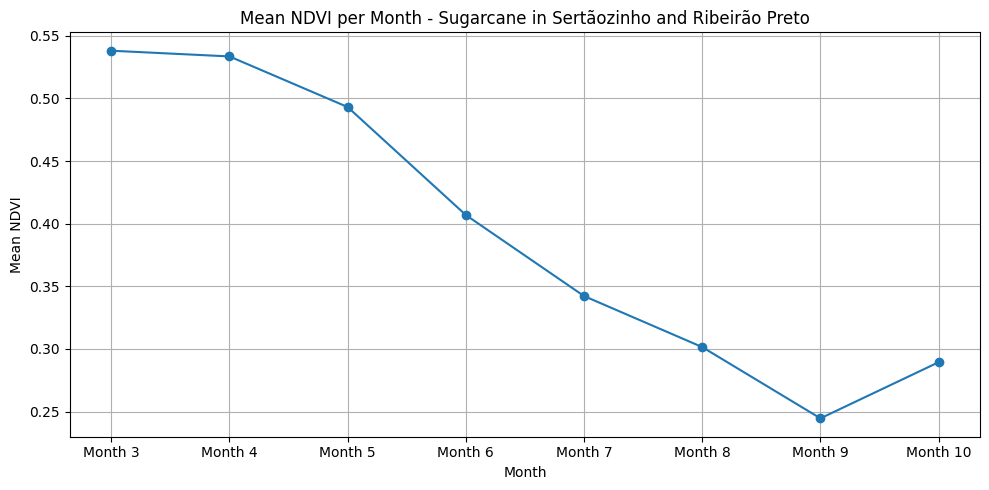

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv(f'{drive_path}/dataset_unificado_filtrado.csv')

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'sertaozinho_ribeirao_preto') & (df['class'] == 'sugarcane')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Sugarcane in Sertãozinho and Ribeirão Preto')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()


eps_filename = "figure8.eps"
plt.savefig(eps_filename, format='eps')

# Download the file (if using Google Colab)
files.download(eps_filename)


plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

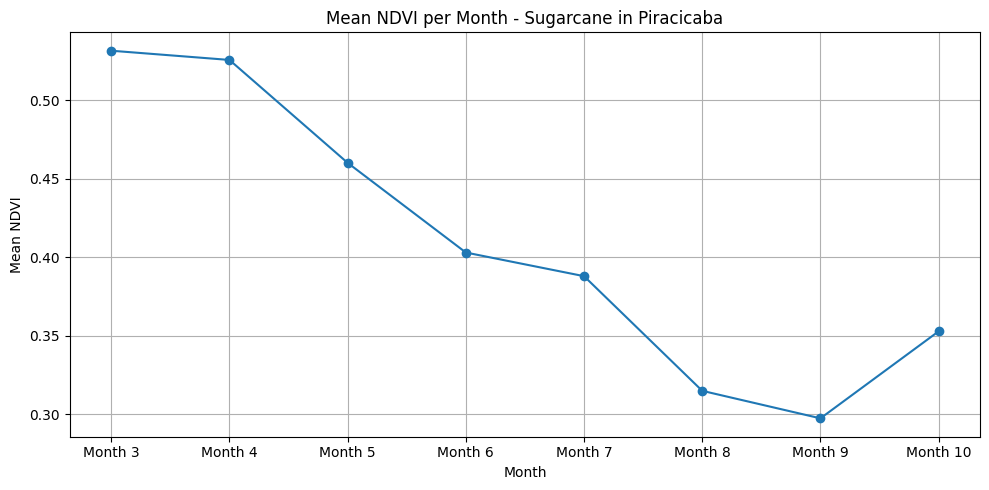

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv(f'{drive_path}/dataset_unificado.csv')

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'piracicaba') & (df['class'] == 'sugarcane')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Sugarcane in Piracicaba')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()


eps_filename = "figure9.eps"
plt.savefig(eps_filename, format='eps')

# Download the file (if using Google Colab)
files.download(eps_filename)
plt.show()


In [ ]:
import pandas as pd
from google.colab import drive


# === Caminho do dataset
caminho_csv = f'{drive_path}/dataset_unificado_filtrado.csv'
df = pd.read_csv(caminho_csv)

# === Extrair o mês da imagem (supondo nome como "4.tif", "5.tif", etc.)
df['month'] = df['image'].str.extract(r'(\d+)').astype(int)

# === Regra 1: SOYBEAN com NDVI > 0.4 em abril ou maio
# === Condição 1 (abril ou maio com NDVI > 0.4)
cond_1 = (
    (df['class'] == 'SOYBEAN') &
    (df['month'].isin([4, 5])) &
    (df['mean_ndvi'] > 0.45)
)

# === Nova condição 1B (NDVI > 0.45 no mês 3)
cond_1b = (
    (df['class'] == 'SOYBEAN') &
    (df['month'] == 3) &
    (df['mean_ndvi'] >= 0.5)
)

# === Unir os object_ids das duas condições
objetos_1 = pd.concat([
    df.loc[cond_1, 'object_id'],
    df.loc[cond_1b, 'object_id']
]).unique()


# === Regra 2: SOYBEAN com NDVI aumentando antes de agosto
objetos_2 = []
soybeans = df[df['class'] == 'SOYBEAN']

for obj_id, grupo in soybeans.groupby('object_id'):
    grupo_ordenado = grupo.sort_values(by='month')
    grupo_filtrado = grupo_ordenado[grupo_ordenado['month'] < 8]
    ndvi = grupo_filtrado['mean_ndvi'].values
    # Verifica se NDVI aumenta de um mês para o seguinte
    if any(np.diff(ndvi) > 0):
        objetos_2.append(obj_id)

# === Unir objetos a serem removidos
objetos_para_remover = set(objetos_1).union(set(objetos_2))

# === Remover todos os objetos com problema
df_filtrado = df[~df['object_id'].isin(objetos_para_remover)]

# === Salvar dataset filtrado localmente
df_filtrado.to_csv('/content/dataset_filtrado.csv', index=False)

# === Caminho no Drive para salvar
caminho_saida = f'{drive_path}/dataset_unificado_filtrado.csv'
df_filtrado.to_csv(caminho_saida, index=False)

print(f'🔻 Objetos removidos: {len(objetos_para_remover)}')
print(f'✅ Amostras restantes: {len(df_filtrado)}')
print(f'📁 Arquivo salvo em: {caminho_saida}')


🔻 Objetos removidos: 0
✅ Amostras restantes: 272752
📁 Arquivo salvo em: /content/drive/MyDrive/Article Temporal SugarCane/dataset_unificado_filtrado.csv


In [ ]:
import pandas as pd

# Caminho do arquivo


# Extrair o número do mês da coluna 'image' (ex: "3.tif" → 3)
df_filtrado['month'] = df_filtrado['image'].str.extract(r'(\d+)').astype(int)

# Filtrar para subpasta "lucas_rio_verde" e mês 3
filtro = (df_filtrado['subfolder'] == 'lucas_rio_verde') & (df_filtrado['month'] == 6)

# Obter o NDVI máximo
ndvi_max = df_filtrado.loc[filtro, 'mean_ndvi'].max()

# Exibir o resultado
print(f'🌿 NDVI máximo em março (mês 3) para lucas_rio_verde: {ndvi_max:.4f}')


🌿 NDVI máximo em março (mês 3) para lucas_rio_verde: 0.3759


/tmp/ipython-input-89-3699471360.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado['month'] = df_filtrado['image'].str.extract(r'(\d+)').astype(int)


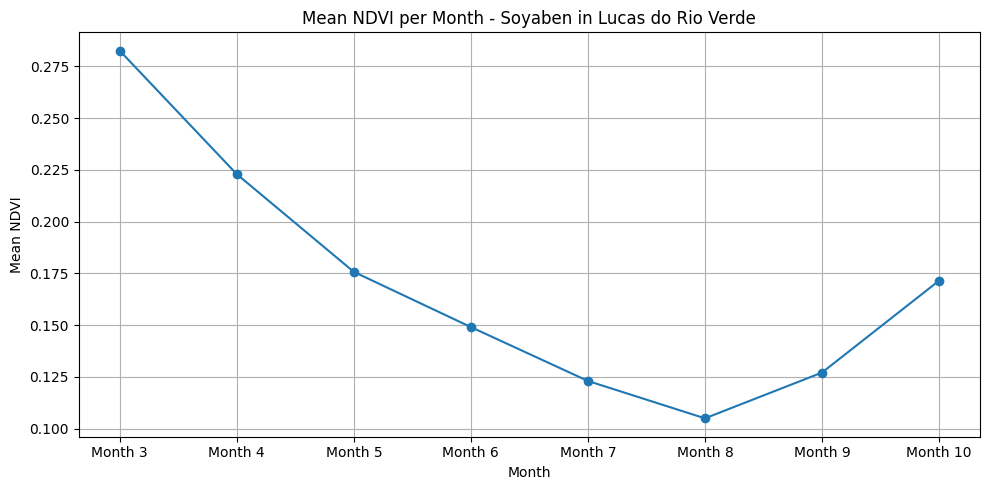

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
csv_path = f'{drive_path}/dataset_unificado_filtrado.csv'
#csv_path = "/content/dataset_filtrado.csv"

# Ler o CSV
df = pd.read_csv(csv_path)
# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'lucas_rio_verde') & (df['class'] == 'SOYBEAN')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Soyaben in Lucas do Rio Verde')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()


eps_filename = "figure10.eps"
plt.savefig(eps_filename, format='eps')
plt.show()


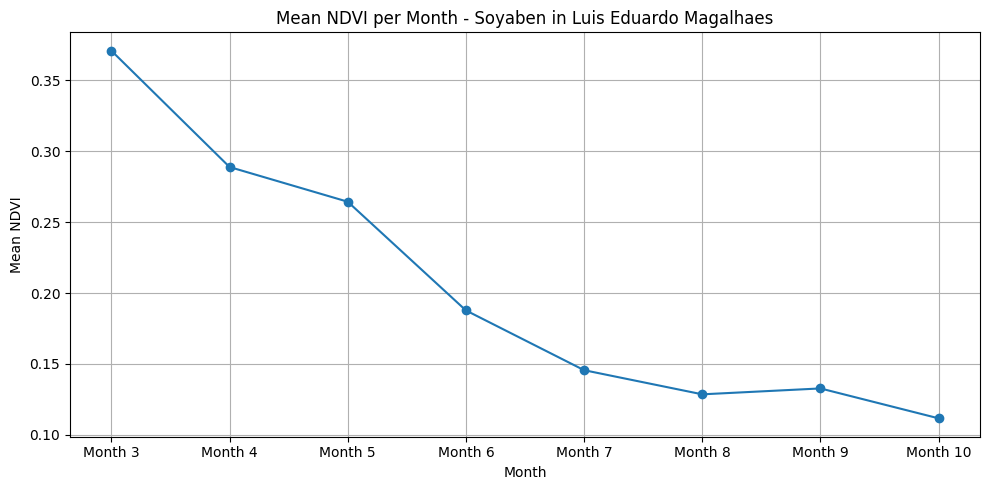

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

csv_path = f'{drive_path}/dataset_unificado_filtrado.csv'
#csv_path = "/content/dataset_filtrado.csv"

# Ler o CSV
df = pd.read_csv(csv_path)

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'luis_eduardo_magalhaes') & (df['class'] == 'SOYBEAN')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Soyaben in Luis Eduardo Magalhaes')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()

eps_filename = "figure12.eps"
plt.savefig(eps_filename, format='eps')
plt.show()


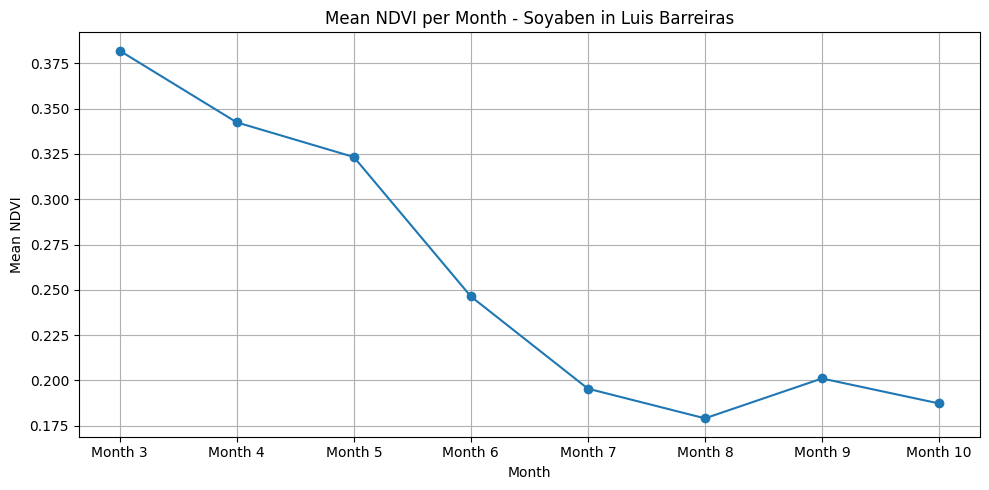

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

csv_path = f'{drive_path}/dataset_unificado_filtrado.csv'
#csv_path = "/content/dataset_filtrado.csv"

# Ler o CSV
df = pd.read_csv(csv_path)

# Filter for 'jaboticabal' and class 'cana'
df_cane_jaboticabal = df[(df['subfolder'] == 'barreiras') & (df['class'] == 'SOYBEAN')].copy()

# Extract the image month number (e.g., "3.tif" -> 3)
df_cane_jaboticabal['month'] = df_cane_jaboticabal['image'].str.extract(r'(\d+)').astype(int)

# Group by month and calculate mean NDVI
mean_ndvi_per_month = df_cane_jaboticabal.groupby('month')['mean_ndvi'].mean().sort_index()

# Prepare x-axis labels
month_labels = [f'Month {m}' for m in mean_ndvi_per_month.index]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(month_labels, mean_ndvi_per_month.values, marker='o')
plt.title('Mean NDVI per Month - Soyaben in Luis Barreiras')
plt.xlabel('Month')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.tight_layout()

eps_filename = "figure11.eps"
plt.savefig(eps_filename, format='eps')
plt.show()

In [ ]:
import pandas as pd

# Dataset path
csv_path = f'{drive_path}/dataset_unificado_filtrado.csv'

# Load the CSV
df = pd.read_csv(csv_path)

# Count number of samples per class
class_counts = df['class'].value_counts()

# Display result
print("Sample count per class:")
print(class_counts)


Sample count per class:
class
OTHERS       167864
sugarcane     86992
SOYBEAN       17896
Name: count, dtype: int64


### Inicio dos treinamentos..

In [ ]:
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 596.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 80.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 109.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 103.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 109.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.31.1
    Uninstalling protobuf-6.31.1:
      Successfully uninstalled protobuf-6.31.1


### avaliacoes com 3 classes


In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv(f'{drive_path}/dataset_unificado_filtrado.csv')

# Extract month number from image name (e.g., "3.tif" → 3)
df['month'] = df['image'].str.extract(r'(\d+)').astype(int)

# Sort to ensure correct sequence
df = df.sort_values(by=['class', 'subfolder', 'object_id', 'month'])

# Get a table with class and subfolder for each object
objects = df.groupby('object_id').first().reset_index()[['object_id', 'class', 'subfolder']]

# Count how many objects there are per class and subfolder
counts = objects.groupby(['class', 'subfolder']).size().reset_index(name='num_objects')
print("Objects per class and subfolder:\n", counts)

# Determine the smallest number of objects per class for balancing
min_per_class = objects['class'].value_counts().min()

# Define how many objects to sample per subfolder within each class proportionally
def stratified_sampling(group):
    total = len(group)
    class_name = group['class'].iloc[0]
    fraction = min_per_class / objects[objects['class'] == class_name].shape[0]
    n = int(round(total * fraction))
    return group.sample(n=n, random_state=42)

# Apply stratified sampling
balanced_objects = (
    objects.groupby(['class', 'subfolder'], group_keys=False)
    .apply(stratified_sampling)
)

# Filter the original dataframe with the selected objects
df_balanced = df[df['object_id'].isin(balanced_objects['object_id'])]

# Final verification
print("Final distribution of objects per class and subfolder:")
print(df_balanced.groupby(['class', 'subfolder'])['object_id'].nunique())

# Check number of rows (should be 8 per object)
print("\nTotal number of records:", df_balanced.shape[0])

df_balanced.to_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv', index=False)
print("\nBalanced dataset saved successfully!")




Objects per class and subfolder:
        class                   subfolder  num_objects
0     OTHERS                  araraquara         6192
1     OTHERS  sertaozinho_ribeirao_preto        14791
2    SOYBEAN                   barreiras         1135
3    SOYBEAN             lucas_rio_verde          274
4    SOYBEAN      luis_eduardo_magalhaes          828
5  sugarcane                  araraquara         1056
6  sugarcane              limeira_araras         6215
7  sugarcane  sertaozinho_ribeirao_preto         3603
Final distribution of objects per class and subfolder:
class      subfolder                 
OTHERS     araraquara                     660
           sertaozinho_ribeirao_preto    1577
SOYBEAN    barreiras                     1135
           lucas_rio_verde                274
           luis_eduardo_magalhaes         828
sugarcane  araraquara                     217
           limeira_araras                1279
           sertaozinho_ribeirao_preto     741
Name: object_id, dt

/tmp/ipython-input-35-1129367600.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(stratified_sampling)



Balanced dataset saved successfully!


In [ ]:
import pandas as pd

# === 1. Carregar dataset original
df = pd.read_csv(f'{drive_path}/dataset_unificado_filtrado.csv')

# === 2. Extrair o mês da imagem
df['month'] = df['image'].str.extract(r'(\d+)').astype(int)

# === 3. Ordenar para garantir sequência correta
df = df.sort_values(by=['class', 'subfolder', 'object_id', 'month'])

# === 4. Criar tabela de objetos únicos com classe e subpasta
objects = df.groupby('object_id').first().reset_index()[['object_id', 'class', 'subfolder']]

# === 5. Obter quantidade de objetos da classe sugarcane
num_sugarcane = objects[objects['class'] == 'sugarcane'].shape[0]

# === 6. Separar objetos da classe OTHERS e sortear uma amostra com mesmo tamanho da sugarcane
others_sampled = (
    objects[objects['class'] == 'OTHERS']
    .sample(n=num_sugarcane, random_state=42)
)

# === 7. Manter todas as amostras das demais classes
remaining = objects[objects['class'] != 'OTHERS']

# === 8. Unir os objetos balanceados
balanced_objects = pd.concat([others_sampled, remaining])

# === 9. Filtrar o DataFrame original com os objetos balanceados
df_balanced = df[df['object_id'].isin(balanced_objects['object_id'])]

# === 10. Verificações finais
print("📊 Distribuição final por classe e subpasta:")
print(df_balanced.groupby(['class', 'subfolder'])['object_id'].nunique())

print("\n📈 Total de registros (linhas):", df_balanced.shape[0])

# === 11. Salvar novo CSV balanceado
df_balanced.to_csv(f'{drive_path}/dataset_2.csv', index=False)
print("✅ Dataset balanceado salvo com sucesso!")


📊 Distribuição final por classe e subpasta:
class      subfolder                 
OTHERS     araraquara                    3208
           sertaozinho_ribeirao_preto    7666
SOYBEAN    barreiras                      537
           lucas_rio_verde                225
           luis_eduardo_magalhaes         370
sugarcane  araraquara                    1056
           limeira_araras                6215
           sertaozinho_ribeirao_preto    3603
Name: object_id, dtype: int64

📈 Total de registros (linhas): 183040
✅ Dataset balanceado salvo com sucesso!


In [ ]:
df_balanced.head(20)

,subfolder,image,object_id,area_m2,rectangularity,mean_ndvi,mean_evi,mean_msavi,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,class,month
42928,araraquara,3.tif,6608,600,1.000000,0.491066,2.921500,0.658651,0.021617,0.000108,0.999999,0.999999,0.666102,OTHERS,3
42929,araraquara,4.tif,6608,600,1.000000,0.515722,2.423563,0.680501,0.023325,0.000113,0.999999,0.999999,0.664734,OTHERS,4
42930,araraquara,5.tif,6608,600,1.000000,0.461936,1.921981,0.631836,0.020297,0.000106,0.999999,0.999999,0.663445,OTHERS,5
42931,araraquara,6.tif,6608,600,1.000000,0.429665,1.998400,0.600789,0.018283,0.000102,0.999999,0.999999,0.658668,OTHERS,6
42932,araraquara,7.tif,6608,600,1.000000,0.429354,1.836663,0.600627,0.019840,0.000106,0.999999,0.999999,0.660620,OTHERS,7
42933,araraquara,8.tif,6608,600,1.000000,0.399512,1.559888,0.570597,0.019327,0.000104,0.999999,0.999999,0.663015,OTHERS,8
42934,araraquara,9.tif,6608,600,1.000000,0.411171,1.840579,0.582316,0.018590,0.000103,0.999999,0.999999,0.662383,OTHERS,9
42935,araraquara,10.tif,6608,600,1.000000,0.490562,2.774860,0.658081,0.023456,0.000115,0.999999,0.999999,0.661862,OTHERS,10
43040,araraquara,3.tif,6622,1800,0.514286,0.486581,3.694632,0.654568,0.096221,0.000486,0.999997,0.999996,0.499082,OTHERS,3
43041,araraquara,4.tif,6622,1800,0.514286,0.480433,2.933450,0.648953,0.095741,0.000485,0.999997,0.999996,0.503260,OTHERS,4


###LSTM

LSTM VERSÃO 2

In [ ]:
!pip install optuna tensorflow

import os
import random
import numpy as np
import pandas as pd
import optuna
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

# === 1. Semente para reprodutibilidade
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# === 2. Carregamento e preparação dos dados
drive_path = "/content/drive/MyDrive/Article Temporal SugarCane"
df = pd.read_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv')
#df = pd.read_csv(f'{drive_path}/dataset_2.csv')

df['month'] = df['image'].str.extract(r'(\d+)').astype(int)
df = df.sort_values(by=['object_id', 'month']).reset_index(drop=True)
df['time'] = df.groupby('object_id').cumcount()

label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])

X_cols = [col for col in df.columns if col not in ['subfolder', 'image', 'class', 'class_encoded', 'object_id', 'time', 'month']]
scaler = StandardScaler()
df[X_cols] = scaler.fit_transform(df[X_cols])

# === 3. Criar sequência temporal por objeto
X = df.pivot(index='object_id', columns='time', values=X_cols).values
X = X.reshape(-1, 8, len(X_cols))
y = df.groupby('object_id')['class_encoded'].first().values
y_cat = to_categorical(y)

# === 4. Separar conjunto de teste (20%)
X_temp, X_test, y_temp, y_test = train_test_split(X, y_cat, stratify=y, test_size=0.2, random_state=SEED)

# === 5. Função objetivo do Optuna
def objective(trial):
    units = trial.suggest_int("units", 32, 128)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)

    X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, stratify=np.argmax(y_temp, axis=1), random_state=SEED)

    model = Sequential()
    model.add(LSTM(units, input_shape=(X.shape[1], X.shape[2]), activation='tanh'))
    model.add(Dropout(dropout))
    model.add(Dense(3, activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])

    es = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=32, verbose=0, callbacks=[es])

    y_pred = model.predict(X_val)
    return accuracy_score(np.argmax(y_val, axis=1), np.argmax(y_pred, axis=1))

# === 6. Executar Optuna
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(objective, n_trials=15)

# === 7. Treinar modelo final com melhor configuração
best = study.best_params
model = Sequential()
model.add(LSTM(best['units'], input_shape=(X.shape[1], X.shape[2]), activation='tanh'))
model.add(Dropout(best['dropout']))
model.add(Dense(3, activation='softmax'))

model.compile(optimizer=Adam(learning_rate=best['lr']), loss='categorical_crossentropy', metrics=['accuracy'])

es_final = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model.fit(X_temp, y_temp, validation_split=0.2, epochs=50, batch_size=32, callbacks=[es_final], verbose=1)

# === 8. Avaliação final no conjunto de teste
y_pred_final = model.predict(X_test)
print("\nFinal model performance (TEST SET):")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_final, axis=1), target_names=label_encoder.classes_))
print("\nBest hyperparameters found:")
print(best)


[I 2025-07-20 23:30:00,347] A new study created in memory with name: no-name-aa30dcf5-5def-4493-833d-0e752d7092c7
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:30:15,377] Trial 0 finished with value: 0.978584729981378 and parameters: {'units': 68, 'dropout': 0.4802857225639665, 'lr': 0.0029106359131330704}. Best is trial 0 with value: 0.978584729981378.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:30:45,903] Trial 1 finished with value: 0.9739292364990689 and parameters: {'units': 90, 'dropout': 0.1624074561769746, 'lr': 0.00020511104188433984}. Best is trial 0 with value: 0.978584729981378.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:30:59,299] Trial 2 finished with value: 0.9720670391061452 and parameters: {'units': 37, 'dropout': 0.4464704583099741, 'lr': 0.0015930522616241021}. Best is trial 0 with value: 0.978584729981378.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:31:17,950] Trial 3 finished with value: 0.9795158286778398 and parameters: {'units': 100, 'dropout': 0.10823379771832098, 'lr': 0.008706020878304856}. Best is trial 3 with value: 0.9795158286778398.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:31:46,997] Trial 4 finished with value: 0.9664804469273743 and parameters: {'units': 112, 'dropout': 0.18493564427131048, 'lr': 0.0002310201887845295}. Best is trial 3 with value: 0.9795158286778398.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:32:07,481] Trial 5 finished with value: 0.9795158286778398 and parameters: {'units': 49, 'dropout': 0.2216968971838151, 'lr': 0.0011207606211860567}. Best is trial 3 with value: 0.9795158286778398.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:32:33,637] Trial 6 finished with value: 0.9813780260707635 and parameters: {'units': 73, 'dropout': 0.21649165607921678, 'lr': 0.0016738085788752138}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:32:56,536] Trial 7 finished with value: 0.978584729981378 and parameters: {'units': 45, 'dropout': 0.21685785941408728, 'lr': 0.0005404103854647331}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:33:22,272] Trial 8 finished with value: 0.9702048417132216 and parameters: {'units': 76, 'dropout': 0.41407038455720546, 'lr': 0.00025081156860452336}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:33:52,683] Trial 9 finished with value: 0.9655493482309124 and parameters: {'units': 81, 'dropout': 0.33696582754481696, 'lr': 0.0001238513729886094}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:34:07,585] Trial 10 finished with value: 0.9739292364990689 and parameters: {'units': 123, 'dropout': 0.28933092858186743, 'lr': 0.004173850019108177}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:34:23,343] Trial 11 finished with value: 0.978584729981378 and parameters: {'units': 101, 'dropout': 0.10350468851418645, 'lr': 0.006536264082965736}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:34:35,794] Trial 12 finished with value: 0.9776536312849162 and parameters: {'units': 59, 'dropout': 0.10262694191032268, 'lr': 0.008962117068342003}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:34:53,488] Trial 13 finished with value: 0.978584729981378 and parameters: {'units': 95, 'dropout': 0.28157665776803004, 'lr': 0.0023204729569644774}. Best is trial 6 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:35:15,148] Trial 14 finished with value: 0.9776536312849162 and parameters: {'units': 109, 'dropout': 0.15382370278773017, 'lr': 0.0007569416237300807}. Best is trial 6 with value: 0.9813780260707635.


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.7657 - loss: 0.6200 - val_accuracy: 0.9078 - val_loss: 0.2449
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9248 - loss: 0.2157 - val_accuracy: 0.9339 - val_loss: 0.1776
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9442 - loss: 0.1580 - val_accuracy: 0.9441 - val_loss: 0.1500
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9575 - loss: 0.1263 - val_accuracy: 0.9469 - val_loss: 0.1342
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9654 - loss: 0.1101 - val_accuracy: 0.9572 - val_loss: 0.1156
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9676 - loss: 0.0986 - val_accuracy: 0.9628 - val_loss: 0.0980
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9709 - loss: 0.0894 - val_accuracy: 0.9702 - val_loss: 0.0967
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9690 - loss: 0.0945 - val_accuracy: 0.9693 - val_

In [ ]:
import json
import joblib

# === 7. Save the trained model
model.save(f'{drive_path}/lstm_model_final.h5')

# === 8. Save best hyperparameters as JSON
with open(f'{drive_path}/lstm_best_hyperparameters.json', 'w') as f:
    json.dump(best, f)

# === 9. Save the scaler
joblib.dump(scaler, f'{drive_path}/scaler_lstm.gz')

# === 10. Save the label encoder
joblib.dump(label_encoder, f'{drive_path}/label_encoder_lstm.gz')

# === 11. Save the list of feature names (X_cols)
with open(f'{drive_path}/x_cols_lstm.json', 'w') as f:
    json.dump(X_cols, f)

print("✅ Model, hyperparameters, scaler, label encoder, and feature list saved successfully.")


✅ Model, hyperparameters, scaler, label encoder, and feature list saved successfully.


✅ EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_lstm.eps


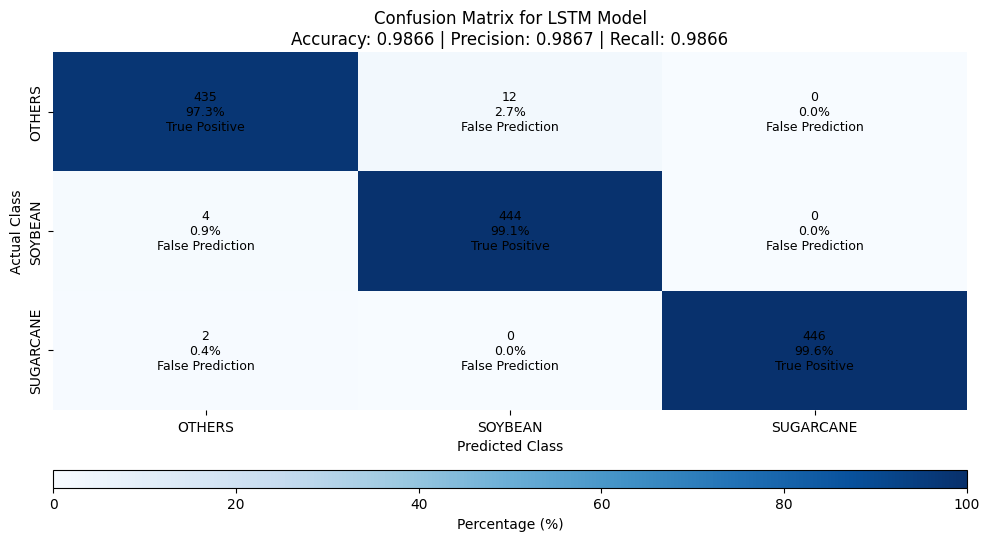

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Convert one-hot to class indices
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred_final, axis=1)

# Get class labels and convert to uppercase
class_names = [name.upper() for name in label_encoder.classes_]

# Confusion matrix (raw counts)
cm = confusion_matrix(y_true, y_pred)

# Normalize to percentages per row
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Accuracy, precision, recall
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

# Plot heatmap
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(
    cm_percentage,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    vmin=0,
    vmax=100,
    cbar=False,
    ax=ax
)

# Add custom annotations
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percentage[i, j]
        if i == j:
            label = f"{count}\n{percent:.1f}%\nTrue Positive"
        else:
            label = f"{count}\n{percent:.1f}%\nFalse Prediction"
        ax.text(j + 0.5, i + 0.5, label, ha='center', va='center', fontsize=9, color='black')

# Set titles and labels
ax.set_title(f"Confusion Matrix for LSTM Model\nAccuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
ax.set_xlabel("Predicted Class")
ax.set_ylabel("Actual Class")

# Add horizontal colorbar below
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.6)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=0, vmax=100)),
    cax=cax,
    orientation='horizontal'
)
cbar.set_label("Percentage (%)")
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')

plt.tight_layout(rect=[0, 0.08, 1, 1])

# Save as EPS
eps_path = '/content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_lstm.eps'
plt.savefig(eps_path, format='eps', dpi=300)
print(f"✅ EPS image saved to: {eps_path}")

plt.show()


In [ ]:
!pip install shap
import shap
import numpy as np
import matplotlib.pyplot as plt
import os

# === 0. Define SHAP type to distinguish file outputs
shap_type = "LSTM"  # change this to "Transformer", "GRU", etc., if needed

# === 1. Flatten input data for KernelExplainer
X_train_flat = X_temp.reshape(X_temp.shape[0], -1)
X_explain = X_test[:10]  # you can increase this if needed
X_explain_flat = X_explain.reshape(X_explain.shape[0], -1)

# === 2. Prediction function adapted to SHAP's expected format
def model_predict(X_flat):
    X_seq = X_flat.reshape((-1, 8, len(X_cols)))
    return model.predict(X_seq)

# === 3. Initialize KernelExplainer with a small background set
explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])

# === 4. Compute SHAP values
shap_values_raw = explainer.shap_values(X_explain_flat)  # shape: (n_samples, n_features, n_classes)

# === 5. Create feature names like "variable_tX"
feature_names = [f"{var}_t{t}" for t in range(8) for var in X_cols]

# === 6. Generate and save summary plots for each class
output_dir = '/content/drive/MyDrive/Article Temporal SugarCane'

num_classes = shap_values_raw.shape[-1]
for class_idx in range(num_classes):
    shap_vals_class = shap_values_raw[:, :, class_idx]

    try:
        class_name = label_encoder.inverse_transform([class_idx])[0].upper()
    except:
        class_name = f"CLASS_{class_idx}"

    # Create and capture the figure from SHAP
    shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)

    # === Save the current figure
    fig = plt.gcf()  # get current figure
    filename = f"shap_summary_{class_name}_{shap_type}.eps"
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, format='eps', dpi=300)
    plt.close(fig)  # close the figure to avoid overlap

    print(f"✅ Saved: {filepath}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 16s 2ms/step


/tmp/ipython-input-50-188060055.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_OTHERS_LSTM.eps


/tmp/ipython-input-50-188060055.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SOYBEAN_LSTM.eps


/tmp/ipython-input-50-188060055.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SUGARCANE_LSTM.eps


 1/39 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1241


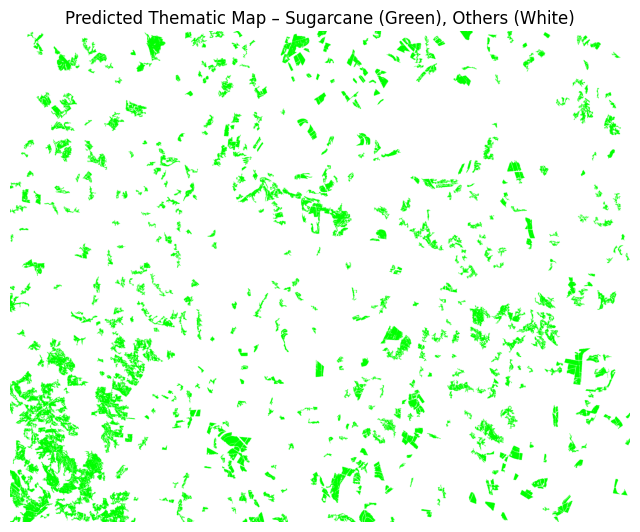

✅ Objetos classificados como cana: 775
✅ Área total estimada de cana: 93210600.00 m²


In [ ]:
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import load_model
import pickle

# === 1. Configurar imagens e gerar máscara por NDVI
pasta_imagens = "/content/cana/cana/cana/piracicaba"
arquivos_tif = [f"{i}.tif" for i in range(3, 11)]  # 8 imagens

# === Usar imagem 3.tif como referência
with rasterio.open(os.path.join(pasta_imagens, '3.tif')) as src:
    red = src.read(3).astype("float32")
    nir = src.read(4).astype("float32")

ndvi = (nir - red) / (nir + red + 1e-6)
mascara_binaria = ndvi > 0.5

# === Rotular objetos
labeled_array, _ = ndimage.label(mascara_binaria)
props = measure.regionprops(labeled_array)

# === Criar mapa com retangularidade fixa
mapa = {}
for prop in props:
    if prop.area > 300:
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        ret = prop.area / bbox_area if bbox_area else 0
        if ret > 0.25:
            mapa[prop.label] = {
                'coords': prop.coords,
                'retangularidade': ret
            }


# === 2. Extrair variáveis por tempo
dados = []
for t_idx, nome_img in enumerate(arquivos_tif):
    caminho_img = os.path.join(pasta_imagens, nome_img)
    with rasterio.open(caminho_img) as src:
        red = src.read(3).astype("float32")
        nir = src.read(4).astype("float32")
        blue = src.read(1).astype("float32")

    mask_invalid = (red == 0) | (nir == 0)
    ndvi = (nir - red) / (nir + red + 1e-6)
    evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
    msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

    ndvi[mask_invalid] = np.nan
    evi[mask_invalid] = np.nan
    msavi[mask_invalid] = np.nan

    ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
    ndvi_norm[np.isnan(ndvi)] = 0

    for obj_id, obj in mapa.items():
        coords = np.array(obj['coords'])
        ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
        evi_vals = evi[coords[:, 0], coords[:, 1]]
        msavi_vals = msavi[coords[:, 0], coords[:, 1]]
        patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

        patch = np.zeros(ndvi.shape, dtype=np.uint8)
        patch[coords[:, 0], coords[:, 1]] = patch_vals

        glcm = graycomatrix(patch, distances=[1], angles=[0], symmetric=True, normed=True)

        features = [
            obj_id,
            t_idx,
            np.sum(~np.isnan(ndvi_vals)) * 100,
            obj['retangularidade'],
            np.nanmean(ndvi_vals),
            np.nanmean(evi_vals),
            np.nanmean(msavi_vals),
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'dissimilarity')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]

        dados.append(features)

# === 3. DataFrame com dados ordenados
df = pd.DataFrame(dados, columns=[
    'object_id','time', 'area_m2', 'retangularity',
    'mean_ndvi', 'mean_evi', 'mean_msavi',
    'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
    'glcm_energy', 'glcm_correlation'
])
df = df.sort_values(by=['object_id', 'time']).reset_index(drop=True)


# === 4. Transformar para entrada da rede (usando o df diretamente)
X_cols = ['area_m2', 'retangularity', 'mean_ndvi', 'mean_evi', 'mean_msavi',
          'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation']

X_df = df[X_cols]
X_array = X_df.to_numpy()
n_objetos = df['object_id'].nunique()
X_novo = X_array.reshape(n_objetos, -1, len(X_cols))


# === 5. Carregar modelo e label_encoder
import joblib
import json
from tensorflow.keras.models import load_model

# Caminho base onde os arquivos foram salvos
# ajuste se necessário

#model = 'transformer'
#model = 'tcn'
model = 'lstm'
#model = 'gru'
#model = 'tsmixer'
#x_cols_tsmixer.jso

# Carregar scaler e label_encoder
scaler = joblib.load(f'{drive_path}/scaler_{model}.gz')
label_encoder = joblib.load(f'{drive_path}/label_encoder_{model}.gz')

# Carregar modelo
model = load_model(f'{drive_path}/{model}_model_final.h5')

# Carregar lista de colunas
with open(f'{drive_path}/x_cols_lstm.json', 'r') as f:
    X_cols = json.load(f)

X_novo = scaler.transform(X_array).reshape(n_objetos, -1, len(X_cols))

# === 6. Classificar
y_pred = model.predict(X_novo)
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))



# === Contagem direta via vetor de predição
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))

mapa_pred = np.ones((*labeled_array.shape, 3))  # branco
total_area_cana = 0
qtd_obj_cana = 0
id_objetos = df['object_id'].unique()

print(len(id_objetos))

for obj_idx, obj_id in enumerate(id_objetos):
    if classe_predita[obj_idx].lower() == 'sugarcane':
        coords = mapa[obj_id]['coords']
        for r, c in coords:
            mapa_pred[r, c] = [0, 1, 0]  # verde
        total_area_cana += df[(df['object_id'] == obj_id) & (df['time'] == 0)]['area_m2'].values[0]
        qtd_obj_cana += 1

# === 8. Visualizar
plt.figure(figsize=(8, 8))
plt.imshow(mapa_pred)
plt.title("Predicted Thematic Map – Sugarcane (Green), Others (White)")
plt.axis('off')

plt.savefig(f"LSTM_new_Image.eps", format='eps', bbox_inches='tight')
plt.show()

# === 9. Estatísticas
print(f"✅ Objetos classificados como cana: {qtd_obj_cana}")
print(f"✅ Área total estimada de cana: {total_area_cana:.2f} m²")



### GRU

### GRU VERSÃO 2

In [ ]:
!pip install optuna tensorflow

import os
import random
import numpy as np
import pandas as pd
import optuna
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

# === 1. Reprodutibilidade
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# === 2. Carregar e preparar o dataset
drive_path = "/content/drive/MyDrive/Article Temporal SugarCane"
df = pd.read_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv')
#df = pd.read_csv(f'{drive_path}/dataset_2.csv')

df['month'] = df['image'].str.extract(r'(\d+)').astype(int)
df = df.sort_values(by=['object_id', 'month']).reset_index(drop=True)
df['time'] = df.groupby('object_id').cumcount()

label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])

X_cols = [col for col in df.columns if col not in ['subfolder', 'image', 'class', 'class_encoded', 'object_id', 'time', 'month']]
scaler = StandardScaler()
df[X_cols] = scaler.fit_transform(df[X_cols])

X = df.pivot(index='object_id', columns='time', values=X_cols).values
X = X.reshape(-1, 8, len(X_cols))
y = df.groupby('object_id')['class_encoded'].first().values
y_cat = to_categorical(y)

# === 3. Separar conjunto de teste (20%)
X_temp, X_test, y_temp, y_test = train_test_split(X, y_cat, stratify=y, test_size=0.2, random_state=SEED)

# === 4. Função objetivo do Optuna (usando apenas X_temp para treino e validação)
def objective(trial):
    units = trial.suggest_int("units", 32, 128)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)

    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=0.2, stratify=np.argmax(y_temp, axis=1), random_state=SEED
    )

    model = Sequential()
    model.add(GRU(units, input_shape=(X.shape[1], X.shape[2]), activation='tanh'))
    model.add(Dropout(dropout))
    model.add(Dense(3, activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    es = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=0)

    model.fit(X_train, y_train, validation_data=(X_val, y_val),
              epochs=30, batch_size=32, verbose=0, callbacks=[es])

    y_pred = model.predict(X_val)
    return accuracy_score(np.argmax(y_val, axis=1), np.argmax(y_pred, axis=1))

# === 5. Executar Optuna
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(objective, n_trials=15)

# === 6. Treinar modelo final com melhores hiperparâmetros
best = study.best_params

model = Sequential()
model.add(GRU(best['units'], input_shape=(X.shape[1], X.shape[2]), activation='tanh'))
model.add(Dropout(best['dropout']))
model.add(Dense(3, activation='softmax'))

model.compile(optimizer=Adam(learning_rate=best['lr']),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

es_final = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model.fit(X_temp, y_temp, validation_split=0.2,
          epochs=50, batch_size=32, callbacks=[es_final], verbose=1)

# === 7. Avaliação final no conjunto de teste
y_pred_final = model.predict(X_test)
print("\nFinal model performance (TEST SET):")
print(classification_report(np.argmax(y_test, axis=1),
                            np.argmax(y_pred_final, axis=1),
                            target_names=label_encoder.classes_))

print("\nBest hyperparameters found:")
print(best)


[I 2025-07-20 23:42:50,390] A new study created in memory with name: no-name-982b95d1-3222-49b3-be94-300eec409959
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:43:04,849] Trial 0 finished with value: 0.9748603351955307 and parameters: {'units': 68, 'dropout': 0.4802857225639665, 'lr': 0.0029106359131330704}. Best is trial 0 with value: 0.9748603351955307.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


[I 2025-07-20 23:43:38,145] Trial 1 finished with value: 0.9739292364990689 and parameters: {'units': 90, 'dropout': 0.1624074561769746, 'lr': 0.00020511104188433984}. Best is trial 0 with value: 0.9748603351955307.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:44:01,952] Trial 2 finished with value: 0.9804469273743017 and parameters: {'units': 37, 'dropout': 0.4464704583099741, 'lr': 0.0015930522616241021}. Best is trial 2 with value: 0.9804469273743017.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:44:16,230] Trial 3 finished with value: 0.9795158286778398 and parameters: {'units': 100, 'dropout': 0.10823379771832098, 'lr': 0.008706020878304856}. Best is trial 2 with value: 0.9804469273743017.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:44:52,934] Trial 4 finished with value: 0.9720670391061452 and parameters: {'units': 112, 'dropout': 0.18493564427131048, 'lr': 0.0002310201887845295}. Best is trial 2 with value: 0.9804469273743017.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:45:21,540] Trial 5 finished with value: 0.9813780260707635 and parameters: {'units': 49, 'dropout': 0.2216968971838151, 'lr': 0.0011207606211860567}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:45:46,899] Trial 6 finished with value: 0.978584729981378 and parameters: {'units': 73, 'dropout': 0.21649165607921678, 'lr': 0.0016738085788752138}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:46:14,721] Trial 7 finished with value: 0.978584729981378 and parameters: {'units': 45, 'dropout': 0.21685785941408728, 'lr': 0.0005404103854647331}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


[I 2025-07-20 23:46:43,800] Trial 8 finished with value: 0.9757914338919925 and parameters: {'units': 76, 'dropout': 0.41407038455720546, 'lr': 0.00025081156860452336}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:47:15,475] Trial 9 finished with value: 0.9459962756052142 and parameters: {'units': 81, 'dropout': 0.33696582754481696, 'lr': 0.0001238513729886094}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:47:44,058] Trial 10 finished with value: 0.9795158286778398 and parameters: {'units': 52, 'dropout': 0.28933092858186743, 'lr': 0.0006199734532912114}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:48:07,080] Trial 11 finished with value: 0.9804469273743017 and parameters: {'units': 33, 'dropout': 0.3262452362725613, 'lr': 0.0026913697323943052}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:48:27,925] Trial 12 finished with value: 0.9776536312849162 and parameters: {'units': 32, 'dropout': 0.49045595994319807, 'lr': 0.0012448484478535578}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:48:42,730] Trial 13 finished with value: 0.9776536312849162 and parameters: {'units': 54, 'dropout': 0.4084792515883464, 'lr': 0.005490065222391827}. Best is trial 5 with value: 0.9813780260707635.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:49:09,437] Trial 14 finished with value: 0.9767225325884544 and parameters: {'units': 60, 'dropout': 0.2737425087025645, 'lr': 0.0008099832735589781}. Best is trial 5 with value: 0.9813780260707635.


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.7097 - loss: 0.6940 - val_accuracy: 0.8845 - val_loss: 0.2905
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9002 - loss: 0.2541 - val_accuracy: 0.9209 - val_loss: 0.2090
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9370 - loss: 0.1951 - val_accuracy: 0.9423 - val_loss: 0.1761
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9479 - loss: 0.1631 - val_accuracy: 0.9460 - val_loss: 0.1582
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9510 - loss: 0.1432 - val_accuracy: 0.9479 - val_loss: 0.1456
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9623 - loss: 0.1200 - val_accuracy: 0.9534 - val_loss: 0.1190
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9638 - loss: 0.1062 - val_accuracy: 0.9590 - val_loss: 0.1142
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9671 - loss: 0.1035 - val_accuracy: 0.9655 - val_

In [ ]:
import json
import joblib

# === 7. Save the trained GRU model
model.save(f'{drive_path}/gru_model_final.h5')

# === 8. Save best hyperparameters as JSON
with open(f'{drive_path}/gru_best_hyperparameters.json', 'w') as f:
    json.dump(best, f)

# === 9. Save the scaler
joblib.dump(scaler, f'{drive_path}/scaler_gru.gz')

# === 10. Save the label encoder
joblib.dump(label_encoder, f'{drive_path}/label_encoder_gru.gz')

# === 11. Save the feature list (X_cols)
with open(f'{drive_path}/x_cols_gru.json', 'w') as f:
    json.dump(X_cols, f)

print("✅ GRU model, hyperparameters, scaler, label encoder, and feature list saved successfully.")


✅ GRU model, hyperparameters, scaler, label encoder, and feature list saved successfully.


✅ EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_gru.eps


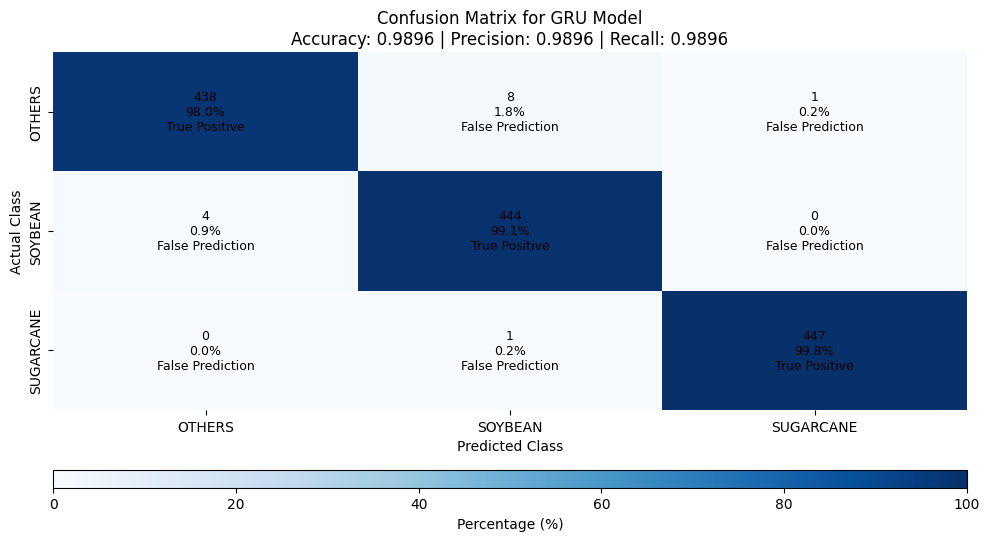

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Convert one-hot to class indices
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred_final, axis=1)

# Get class labels and convert to uppercase
class_names = [name.upper() for name in label_encoder.classes_]

# Confusion matrix (raw counts)
cm = confusion_matrix(y_true, y_pred)

# Normalize to percentages per row
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Accuracy, precision, recall
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

# Plot heatmap
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(
    cm_percentage,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    vmin=0,
    vmax=100,
    cbar=False,
    ax=ax
)

# Add custom annotations
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percentage[i, j]
        if i == j:
            label = f"{count}\n{percent:.1f}%\nTrue Positive"
        else:
            label = f"{count}\n{percent:.1f}%\nFalse Prediction"
        ax.text(j + 0.5, i + 0.5, label, ha='center', va='center', fontsize=9, color='black')

# Set titles and labels
ax.set_title(f"Confusion Matrix for GRU Model\nAccuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
ax.set_xlabel("Predicted Class")
ax.set_ylabel("Actual Class")

# Add horizontal colorbar below
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.6)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=0, vmax=100)),
    cax=cax,
    orientation='horizontal'
)
cbar.set_label("Percentage (%)")
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')

plt.tight_layout(rect=[0, 0.08, 1, 1])

# Save as EPS
eps_path = '/content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_gru.eps'
plt.savefig(eps_path, format='eps', dpi=300)
print(f"✅ EPS image saved to: {eps_path}")

plt.show()


In [ ]:
!pip install shap
import shap
import numpy as np
import matplotlib.pyplot as plt
import os

# === 0. Define SHAP type to distinguish file outputs
shap_type = "GRU"  # identifier for the model type

# === 1. Flatten input data for KernelExplainer
X_train_flat = X_temp.reshape(X_temp.shape[0], -1)
X_explain = X_test[:10]  # you can increase this if needed
X_explain_flat = X_explain.reshape(X_explain.shape[0], -1)

# === 2. Prediction function adapted to SHAP's expected format
def model_predict(X_flat):
    X_seq = X_flat.reshape((-1, 8, len(X_cols)))
    return model.predict(X_seq)

# === 3. Initialize KernelExplainer with a small background set
explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])

# === 4. Compute SHAP values
shap_values_raw = explainer.shap_values(X_explain_flat)  # shape: (n_samples, n_features, n_classes)

# === 5. Create feature names like "variable_tX"
feature_names = [f"{var}_t{t}" for t in range(8) for var in X_cols]

# === 6. Generate and save summary plots for each class
output_dir = '/content/drive/MyDrive/Article Temporal SugarCane'

num_classes = shap_values_raw.shape[-1]
for class_idx in range(num_classes):
    shap_vals_class = shap_values_raw[:, :, class_idx]

    try:
        class_name = label_encoder.inverse_transform([class_idx])[0].upper()
    except:
        class_name = f"CLASS_{class_idx}"

    # Create and capture the figure from SHAP
    shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)

    fig = plt.gcf()  # get current figure
    filename = f"shap_summary_{class_name}_{shap_type}.eps"
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, format='eps', dpi=300)
    plt.close(fig)  # close the figure to avoid overlap

    print(f"✅ Saved: {filepath}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step


/tmp/ipython-input-55-3447301473.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_OTHERS_GRU.eps


/tmp/ipython-input-55-3447301473.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SOYBEAN_GRU.eps


/tmp/ipython-input-55-3447301473.py:42: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SUGARCANE_GRU.eps


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


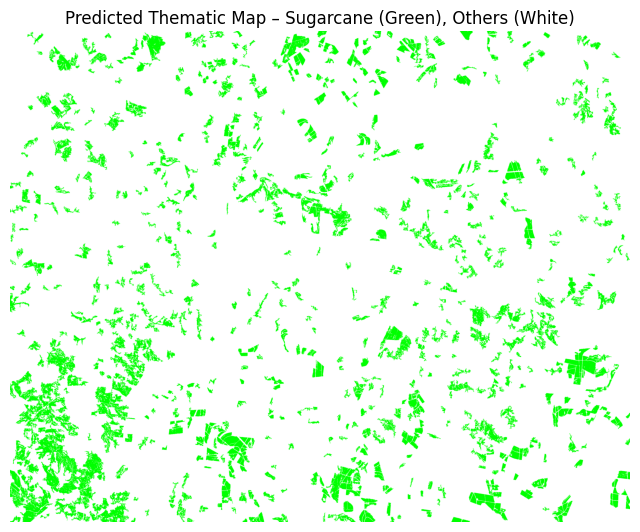

✅ Objetos classificados como cana: 962
✅ Área total estimada de cana: 106026800.00 m²


In [ ]:
!pip install rasterio
!pip install tensorflow
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import load_model
import pickle

# === 1. Configurar imagens e gerar máscara por NDVI
pasta_imagens = "/content/cana/cana/cana/piracicaba"
arquivos_tif = [f"{i}.tif" for i in range(3, 11)]  # 8 imagens

# === Usar imagem 3.tif como referência
with rasterio.open(os.path.join(pasta_imagens, '3.tif')) as src:
    red = src.read(3).astype("float32")
    nir = src.read(4).astype("float32")

ndvi = (nir - red) / (nir + red + 1e-6)
mascara_binaria = ndvi > 0.5

# === Rotular objetos
labeled_array, _ = ndimage.label(mascara_binaria)
props = measure.regionprops(labeled_array)

# === Criar mapa com retangularidade fixa
mapa = {}
for prop in props:
    if prop.area > 300:
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        ret = prop.area / bbox_area if bbox_area else 0
        if ret > 0.25:
            mapa[prop.label] = {
                'coords': prop.coords,
                'retangularidade': ret
            }

# === 2. Extrair variáveis por tempo
dados = []
for t_idx, nome_img in enumerate(arquivos_tif):
    caminho_img = os.path.join(pasta_imagens, nome_img)
    with rasterio.open(caminho_img) as src:
        red = src.read(3).astype("float32")
        nir = src.read(4).astype("float32")
        blue = src.read(1).astype("float32")

    mask_invalid = (red == 0) | (nir == 0)
    ndvi = (nir - red) / (nir + red + 1e-6)
    evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
    msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

    ndvi[mask_invalid] = np.nan
    evi[mask_invalid] = np.nan
    msavi[mask_invalid] = np.nan

    ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
    ndvi_norm[np.isnan(ndvi)] = 0

    for obj_id, obj in mapa.items():
        coords = np.array(obj['coords'])
        ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
        evi_vals = evi[coords[:, 0], coords[:, 1]]
        msavi_vals = msavi[coords[:, 0], coords[:, 1]]
        patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

        patch = np.zeros(ndvi.shape, dtype=np.uint8)
        patch[coords[:, 0], coords[:, 1]] = patch_vals

        glcm = graycomatrix(patch, distances=[1], angles=[0], symmetric=True, normed=True)

        features = [
            obj_id,
            t_idx,
            np.sum(~np.isnan(ndvi_vals)) * 100,
            obj['retangularidade'],
            np.nanmean(ndvi_vals),
            np.nanmean(evi_vals),
            np.nanmean(msavi_vals),
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'dissimilarity')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]

        dados.append(features)

# === 3. DataFrame com dados ordenados
df = pd.DataFrame(dados, columns=[
    'object_id','time', 'area_m2', 'retangularity',
    'mean_ndvi', 'mean_evi', 'mean_msavi',
    'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
    'glcm_energy', 'glcm_correlation'
])
df = df.sort_values(by=['object_id', 'time']).reset_index(drop=True)


# === 4. Transformar para entrada da rede (usando o df diretamente)
X_cols = ['area_m2', 'retangularity', 'mean_ndvi', 'mean_evi', 'mean_msavi',
          'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation']

X_df = df[X_cols]
X_array = X_df.to_numpy()
n_objetos = df['object_id'].nunique()
X_novo = X_array.reshape(n_objetos, -1, len(X_cols))


# === 5. Carregar modelo e label_encoder
import joblib
import json
from tensorflow.keras.models import load_model

# Caminho base onde os arquivos foram salvos
# ajuste se necessário

#model = 'transformer'
#model = 'tcn'
#model = 'lstm'
model = 'gru'
#model = 'tsmixer'
#x_cols_tsmixer.jso

# Carregar scaler e label_encoder
scaler = joblib.load(f'{drive_path}/scaler_{model}.gz')
label_encoder = joblib.load(f'{drive_path}/label_encoder_{model}.gz')

# Carregar modelo
model = load_model(f'{drive_path}/{model}_model_final.h5')

# Carregar lista de colunas
with open(f'{drive_path}/x_cols_gru.json', 'r') as f:
    X_cols = json.load(f)

X_novo = scaler.transform(X_array).reshape(n_objetos, -1, len(X_cols))

# === 6. Classificar
y_pred = model.predict(X_novo)
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))



mapa_pred = np.ones((*labeled_array.shape, 3))  # branco
total_area_cana = 0
qtd_obj_cana = 0
id_objetos = df['object_id'].unique()

for obj_idx, obj_id in enumerate(id_objetos):
    if classe_predita[obj_idx].lower() == 'sugarcane':
        coords = mapa[obj_id]['coords']
        for r, c in coords:
            mapa_pred[r, c] = [0, 1, 0]  # verde
        total_area_cana += df[(df['object_id'] == obj_id) & (df['time'] == 0)]['area_m2'].values[0]
        qtd_obj_cana += 1

# === 8. Visualizar
plt.figure(figsize=(8, 8))
plt.imshow(mapa_pred)
plt.title("Predicted Thematic Map – Sugarcane (Green), Others (White)")
plt.axis('off')

plt.savefig(f"GRU_new_Image.eps", format='eps', bbox_inches='tight')
plt.show()

# === 9. Estatísticas
print(f"✅ Objetos classificados como cana: {qtd_obj_cana}")
print(f"✅ Área total estimada de cana: {total_area_cana:.2f} m²")



### Transformers


### TRANSFORMERS VERSÂO 2

In [ ]:
!pip install optuna tensorflow

import os
import random
import numpy as np
import pandas as pd
import optuna
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, GlobalAveragePooling1D
from tensorflow.keras.layers import MultiHeadAttention, Add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

# === 1. Reprodutibilidade
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# === 2. Carregar e preparar o dataset
drive_path = "/content/drive/MyDrive/Article Temporal SugarCane"
df = pd.read_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv')
#df = pd.read_csv(f'{drive_path}/dataset_2.csv')

df['month'] = df['image'].str.extract(r'(\d+)').astype(int)
df = df.sort_values(by=['object_id', 'month']).reset_index(drop=True)
df['time'] = df.groupby('object_id').cumcount()

label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])

X_cols = [col for col in df.columns if col not in ['subfolder', 'image', 'class', 'class_encoded', 'object_id', 'time', 'month']]
scaler = StandardScaler()
df[X_cols] = scaler.fit_transform(df[X_cols])

X = df.pivot(index='object_id', columns='time', values=X_cols).values
X = X.reshape(-1, 8, len(X_cols))
y = df.groupby('object_id')['class_encoded'].first().values
y_cat = to_categorical(y)

# === 3. Separar conjunto de teste
X_temp, X_test, y_temp, y_test = train_test_split(X, y_cat, stratify=y, test_size=0.2, random_state=SEED)

# === 4. Modelo Transformer
def build_transformer_model(input_shape, num_heads, ff_dim, dropout_rate, lr):
    inputs = Input(shape=input_shape)
    input_dim = input_shape[-1]

    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=input_dim // num_heads)(inputs, inputs)
    attn_output = Dense(input_dim)(attn_output)
    attn_output = Dropout(dropout_rate)(attn_output)

    out1 = Add()([inputs, attn_output])
    out1 = LayerNormalization(epsilon=1e-6)(out1)

    ff_output = Dense(ff_dim, activation='relu')(out1)
    ff_output = Dropout(dropout_rate)(ff_output)
    ff_output = Dense(input_dim)(ff_output)

    out2 = Add()([out1, ff_output])
    out2 = LayerNormalization(epsilon=1e-6)(out2)

    x = GlobalAveragePooling1D()(out2)
    outputs = Dense(3, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# === 5. Objetivo Optuna com treino e validação
def objective(trial):
    num_heads = trial.suggest_categorical("num_heads", [2, 4, 8])
    ff_dim = trial.suggest_int("ff_dim", 32, 128)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)

    X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, stratify=np.argmax(y_temp, axis=1), random_state=SEED)

    model = build_transformer_model(X.shape[1:], num_heads, ff_dim, dropout, lr)
    es = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=0)

    model.fit(X_train, y_train, validation_data=(X_val, y_val),
              epochs=30, batch_size=32, verbose=0, callbacks=[es])

    y_pred = model.predict(X_val)
    return accuracy_score(np.argmax(y_val, axis=1), np.argmax(y_pred, axis=1))

# === 6. Rodar Optuna
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(objective, n_trials=15)

# === 7. Treinar modelo final com melhores hiperparâmetros
best = study.best_params
model = build_transformer_model(X.shape[1:], best['num_heads'], best['ff_dim'], best['dropout'], best['lr'])

es_final = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model.fit(X_temp, y_temp, validation_split=0.2, epochs=50, batch_size=32, callbacks=[es_final], verbose=1)

# === 8. Avaliação final
y_pred_final = model.predict(X_test)
print("\nFinal model performance (TEST SET):")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_final, axis=1),
                            target_names=label_encoder.classes_))

print("\nBest hyperparameters found:")
print(best)


[I 2025-07-20 23:56:15,632] A new study created in memory with name: no-name-7518bd95-ab32-48d0-9f53-05a4ef3c47e3


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:56:43,898] Trial 0 finished with value: 0.9646182495344506 and parameters: {'num_heads': 4, 'ff_dim': 90, 'dropout': 0.1624074561769746, 'lr': 0.00020511104188433984}. Best is trial 0 with value: 0.9646182495344506.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:56:55,279] Trial 1 finished with value: 0.9674115456238361 and parameters: {'num_heads': 4, 'ff_dim': 100, 'dropout': 0.10823379771832098, 'lr': 0.008706020878304856}. Best is trial 1 with value: 0.9674115456238361.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:57:14,919] Trial 2 finished with value: 0.9711359404096834 and parameters: {'num_heads': 2, 'ff_dim': 49, 'dropout': 0.2216968971838151, 'lr': 0.0011207606211860567}. Best is trial 2 with value: 0.9711359404096834.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:57:40,064] Trial 3 finished with value: 0.962756052141527 and parameters: {'num_heads': 8, 'ff_dim': 45, 'dropout': 0.21685785941408728, 'lr': 0.0005404103854647331}. Best is trial 2 with value: 0.9711359404096834.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:58:05,895] Trial 4 finished with value: 0.9413407821229051 and parameters: {'num_heads': 4, 'ff_dim': 81, 'dropout': 0.33696582754481696, 'lr': 0.0001238513729886094}. Best is trial 2 with value: 0.9711359404096834.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:58:16,755] Trial 5 finished with value: 0.9655493482309124 and parameters: {'num_heads': 2, 'ff_dim': 124, 'dropout': 0.4862528132298237, 'lr': 0.004138040112561018}. Best is trial 2 with value: 0.9711359404096834.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:58:31,820] Trial 6 finished with value: 0.9739292364990689 and parameters: {'num_heads': 8, 'ff_dim': 74, 'dropout': 0.14881529393791154, 'lr': 0.0009780337016659412}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:58:50,177] Trial 7 finished with value: 0.9683426443202979 and parameters: {'num_heads': 4, 'ff_dim': 96, 'dropout': 0.2246844304357644, 'lr': 0.001096821720752952}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


[I 2025-07-20 23:59:04,411] Trial 8 finished with value: 0.9646182495344506 and parameters: {'num_heads': 8, 'ff_dim': 107, 'dropout': 0.4757995766256756, 'lr': 0.006161049539380964}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:59:29,087] Trial 9 finished with value: 0.9683426443202979 and parameters: {'num_heads': 4, 'ff_dim': 51, 'dropout': 0.11809091556421523, 'lr': 0.0004473636174621269}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-20 23:59:47,492] Trial 10 finished with value: 0.9720670391061452 and parameters: {'num_heads': 8, 'ff_dim': 67, 'dropout': 0.3247364766906666, 'lr': 0.0022005828785027406}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-21 00:00:05,279] Trial 11 finished with value: 0.9692737430167597 and parameters: {'num_heads': 8, 'ff_dim': 67, 'dropout': 0.34804015325750093, 'lr': 0.0025899549005711305}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-21 00:00:21,560] Trial 12 finished with value: 0.9674115456238361 and parameters: {'num_heads': 8, 'ff_dim': 68, 'dropout': 0.4060598442598034, 'lr': 0.002440392476448934}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-21 00:00:36,745] Trial 13 finished with value: 0.972998137802607 and parameters: {'num_heads': 8, 'ff_dim': 69, 'dropout': 0.28908560266317945, 'lr': 0.0017340750366137945}. Best is trial 6 with value: 0.9739292364990689.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-07-21 00:00:58,750] Trial 14 finished with value: 0.9683426443202979 and parameters: {'num_heads': 8, 'ff_dim': 34, 'dropout': 0.27662659354600705, 'lr': 0.0005769962121851423}. Best is trial 6 with value: 0.9739292364990689.


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.6977 - loss: 0.7694 - val_accuracy: 0.8845 - val_loss: 0.3699
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8954 - loss: 0.3231 - val_accuracy: 0.9069 - val_loss: 0.2544
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9198 - loss: 0.2407 - val_accuracy: 0.9209 - val_loss: 0.2003
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9383 - loss: 0.1931 - val_accuracy: 0.9348 - val_loss: 0.1731
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9489 - loss: 0.1636 - val_accuracy: 0.9413 - val_loss: 0.1555
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9457 - loss: 0.1520 - val_accuracy: 0.9441 - val_loss: 0.1436
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9501 - loss: 0.1392 - val_accuracy: 0.9479 - val_loss: 0.1374
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9565 - loss: 0.1226 - val_accuracy: 0.

In [ ]:
import json
import joblib

# === 8. Save the trained Transformer model
model.save('/content/drive/MyDrive/Article Temporal SugarCane/transformer_model_final.h5')

# === 9. Save the best hyperparameters as JSON
with open('/content/drive/MyDrive/Article Temporal SugarCane/transformer_best_hyperparameters.json', 'w') as f:
    json.dump(best, f)

# === 10. Save the scaler
joblib.dump(scaler, '/content/drive/MyDrive/Article Temporal SugarCane/scaler_transformer.gz')

# === 11. Save the label encoder
joblib.dump(label_encoder, '/content/drive/MyDrive/Article Temporal SugarCane/label_encoder_transformer.gz')

# === 12. Save the list of input columns
with open('/content/drive/MyDrive/Article Temporal SugarCane/x_cols_transformer.json', 'w') as f:
    json.dump(X_cols, f)

print("✅ Transformer model, hyperparameters, scaler, label encoder, and input feature list saved successfully.")



✅ Transformer model, hyperparameters, scaler, label encoder, and input feature list saved successfully.


✅ EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_transformer.eps


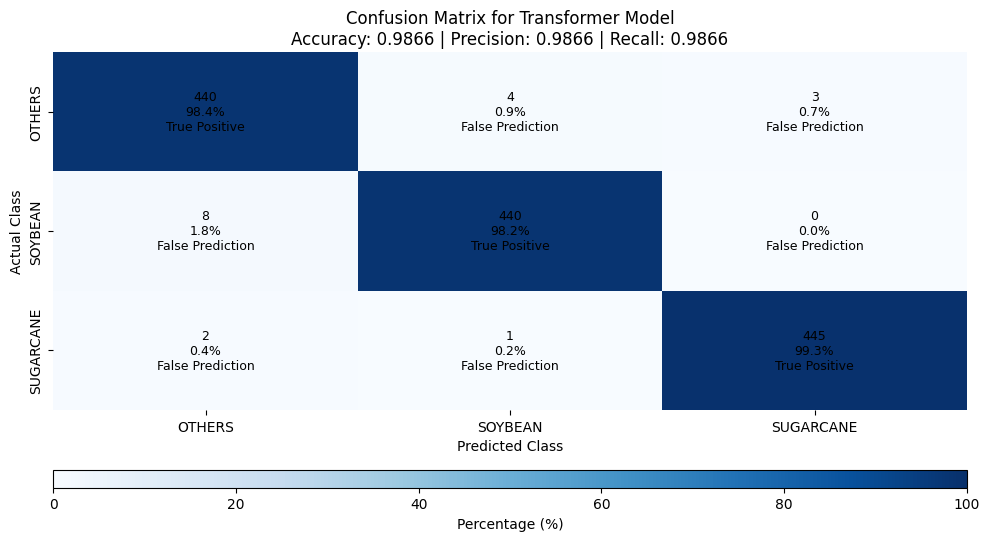

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

# === 1. Convert predictions from one-hot to class indices
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred_final, axis=1)

# === 2. Get class labels in uppercase
class_names = [cls.upper() for cls in label_encoder.classes_]

# === 3. Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# === 4. Normalize matrix row-wise to get percentage values
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# === 5. Compute metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

# === 6. Plot the matrix
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(
    cm_percentage,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    vmin=0,
    vmax=100,
    cbar=False,
    ax=ax
)

# === 7. Add cell labels (count, %, description)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percentage[i, j]
        if i == j:
            label = f"{count}\n{percent:.1f}%\nTrue Positive"
        else:
            label = f"{count}\n{percent:.1f}%\nFalse Prediction"
        ax.text(j + 0.5, i + 0.5, label, ha='center', va='center', fontsize=9, color='black')

# === 8. Titles and axis labels
ax.set_title(f"Confusion Matrix for Transformer Model\nAccuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
ax.set_xlabel("Predicted Class")
ax.set_ylabel("Actual Class")

# === 9. Colorbar (horizontal)
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.6)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=0, vmax=100)),
    cax=cax,
    orientation='horizontal'
)
cbar.set_label("Percentage (%)")
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')

plt.tight_layout(rect=[0, 0.08, 1, 1])

# === 10. Save as EPS
eps_path = '/content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_transformer.eps'
plt.savefig(eps_path, format='eps', dpi=300)
print(f"✅ EPS image saved to: {eps_path}")

plt.show()


In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import os

# === 0. Define SHAP type for file naming
shap_type = "TRANSFORMER"

# === 1. Flatten input data for KernelExplainer
X_train_flat = X_temp.reshape(X_temp.shape[0], -1)
X_explain = X_test[:10]  # or more, if desired
X_explain_flat = X_explain.reshape(X_explain.shape[0], -1)

# === 2. Prediction function for SHAP
def model_predict(X_flat):
    X_seq = X_flat.reshape((-1, 8, len(X_cols)))
    return model.predict(X_seq)

# === 3. Initialize KernelExplainer
explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])

# === 4. Compute SHAP values
shap_values_raw = explainer.shap_values(X_explain_flat)  # shape: (n_samples, n_features, n_classes)

# === 5. Build feature names like "feature_t0"
feature_names = [f"{var}_t{t}" for t in range(8) for var in X_cols]

# === 6. Generate and save SHAP summary plot for each class
output_dir = '/content/drive/MyDrive/Article Temporal SugarCane'
num_classes = shap_values_raw.shape[-1]

for class_idx in range(num_classes):
    shap_vals_class = shap_values_raw[:, :, class_idx]

    try:
        class_name = label_encoder.inverse_transform([class_idx])[0].upper()
    except:
        class_name = f"CLASS_{class_idx}"

    # Create and save the summary plot
    shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)

    fig = plt.gcf()  # get current figure
    filename = f"shap_summary_{class_name}_{shap_type}.eps"
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, format='eps', dpi=300)
    plt.close(fig)

    print(f"✅ Saved: {filepath}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step


/tmp/ipython-input-60-3822224548.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_OTHERS_TRANSFORMER.eps


/tmp/ipython-input-60-3822224548.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SOYBEAN_TRANSFORMER.eps


/tmp/ipython-input-60-3822224548.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SUGARCANE_TRANSFORMER.eps


 1/39 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


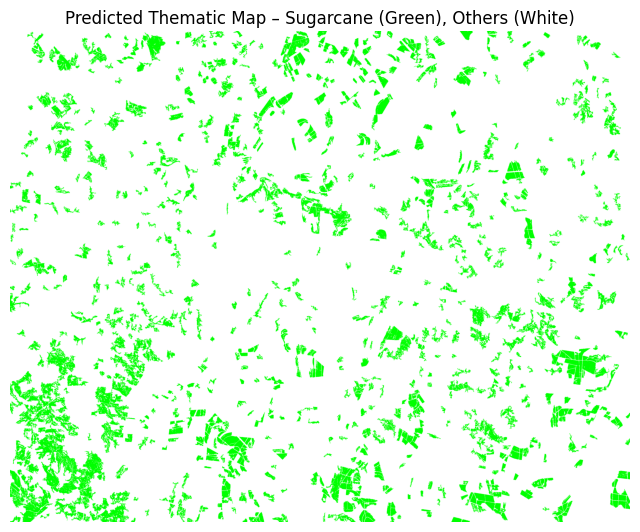

✅ Objetos classificados como cana: 1121
✅ Área total estimada de cana: 117174300.00 m²


In [ ]:
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import load_model
import pickle

# === 1. Configurar imagens e gerar máscara por NDVI
pasta_imagens = "/content/cana/cana/cana/piracicaba"
arquivos_tif = [f"{i}.tif" for i in range(3, 11)]  # 8 imagens

# === Usar imagem 3.tif como referência
with rasterio.open(os.path.join(pasta_imagens, '3.tif')) as src:
    red = src.read(3).astype("float32")
    nir = src.read(4).astype("float32")

ndvi = (nir - red) / (nir + red + 1e-6)
mascara_binaria = ndvi > 0.5

# === Rotular objetos
labeled_array, _ = ndimage.label(mascara_binaria)
props = measure.regionprops(labeled_array)

# === Criar mapa com retangularidade fixa
mapa = {}
for prop in props:
    if prop.area > 300:
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        ret = prop.area / bbox_area if bbox_area else 0
        if ret > 0.25:
            mapa[prop.label] = {
                'coords': prop.coords,
                'retangularidade': ret
            }

# === 2. Extrair variáveis por tempo
dados = []
for t_idx, nome_img in enumerate(arquivos_tif):
    caminho_img = os.path.join(pasta_imagens, nome_img)
    with rasterio.open(caminho_img) as src:
        red = src.read(3).astype("float32")
        nir = src.read(4).astype("float32")
        blue = src.read(1).astype("float32")

    mask_invalid = (red == 0) | (nir == 0)
    ndvi = (nir - red) / (nir + red + 1e-6)
    evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
    msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

    ndvi[mask_invalid] = np.nan
    evi[mask_invalid] = np.nan
    msavi[mask_invalid] = np.nan

    ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
    ndvi_norm[np.isnan(ndvi)] = 0

    for obj_id, obj in mapa.items():
        coords = np.array(obj['coords'])
        ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
        evi_vals = evi[coords[:, 0], coords[:, 1]]
        msavi_vals = msavi[coords[:, 0], coords[:, 1]]
        patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

        patch = np.zeros(ndvi.shape, dtype=np.uint8)
        patch[coords[:, 0], coords[:, 1]] = patch_vals

        glcm = graycomatrix(patch, distances=[1], angles=[0], symmetric=True, normed=True)

        features = [
            obj_id,
            t_idx,
            np.sum(~np.isnan(ndvi_vals)) * 100,
            obj['retangularidade'],
            np.nanmean(ndvi_vals),
            np.nanmean(evi_vals),
            np.nanmean(msavi_vals),
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'dissimilarity')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]

        dados.append(features)

# === 3. DataFrame com dados ordenados
df = pd.DataFrame(dados, columns=[
    'object_id','time', 'area_m2', 'retangularity',
    'mean_ndvi', 'mean_evi', 'mean_msavi',
    'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
    'glcm_energy', 'glcm_correlation'
])
df = df.sort_values(by=['object_id', 'time']).reset_index(drop=True)


# === 4. Transformar para entrada da rede (usando o df diretamente)
X_cols = ['area_m2', 'retangularity', 'mean_ndvi', 'mean_evi', 'mean_msavi',
          'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation']

X_df = df[X_cols]
X_array = X_df.to_numpy()
n_objetos = df['object_id'].nunique()
X_novo = X_array.reshape(n_objetos, -1, len(X_cols))


# === 5. Carregar modelo e label_encoder
import joblib
import json
from tensorflow.keras.models import load_model

# Caminho base onde os arquivos foram salvos
# ajuste se necessário

model = 'transformer'
#model = 'tcn'
#model = 'lstm'
#model = 'gru'
#model = 'tsmixer'
#x_cols_tsmixer.jso

# Carregar scaler e label_encoder
scaler = joblib.load(f'{drive_path}/scaler_{model}.gz')
label_encoder = joblib.load(f'{drive_path}/label_encoder_{model}.gz')

# Carregar modelo
model = load_model(f'{drive_path}/{model}_model_final.h5')

# Carregar lista de colunas
with open(f'{drive_path}/x_cols_transformer.json', 'r') as f:
    X_cols = json.load(f)

X_novo = scaler.transform(X_array).reshape(n_objetos, -1, len(X_cols))

# === 6. Classificar
y_pred = model.predict(X_novo)
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))



mapa_pred = np.ones((*labeled_array.shape, 3))  # branco
total_area_cana = 0
qtd_obj_cana = 0
id_objetos = df['object_id'].unique()

for obj_idx, obj_id in enumerate(id_objetos):
    if classe_predita[obj_idx].lower() == 'sugarcane':
        coords = mapa[obj_id]['coords']
        for r, c in coords:
            mapa_pred[r, c] = [0, 1, 0]  # verde
        total_area_cana += df[(df['object_id'] == obj_id) & (df['time'] == 0)]['area_m2'].values[0]
        qtd_obj_cana += 1

# === 8. Visualizar
plt.figure(figsize=(8, 8))
plt.imshow(mapa_pred)
plt.title("Predicted Thematic Map – Sugarcane (Green), Others (White)")
plt.axis('off')


plt.savefig(f"Transformers_new_Image.eps", format='eps', bbox_inches='tight')
plt.show()

# === 9. Estatísticas
print(f"✅ Objetos classificados como cana: {qtd_obj_cana}")
print(f"✅ Área total estimada de cana: {total_area_cana:.2f} m²")



###TSMixer

### TSMIXER VERSÂO 2

In [ ]:
!pip install optuna tensorflow

# === Imports
import os
import random
import numpy as np
import pandas as pd
import optuna
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import TimeSeriesSplit, train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, GlobalAveragePooling1D
from tensorflow.keras.layers import Permute, Add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

# === 1. Set seed for reproducibility
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# === 2. Load and prepare the dataset
drive_path = "/content/drive/MyDrive/Article Temporal SugarCane"
df = pd.read_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv')
#df = pd.read_csv(f'{drive_path}/dataset_2.csv')

df['month'] = df['image'].str.extract(r'(\d+)').astype(int)
df = df.sort_values(by=['object_id', 'month']).reset_index(drop=True)
df['time'] = df.groupby('object_id').cumcount()

label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])

X_cols = [col for col in df.columns if col not in ['subfolder', 'image', 'class', 'class_encoded', 'object_id', 'time', 'month']]
scaler = StandardScaler()
df[X_cols] = scaler.fit_transform(df[X_cols])

X = df.pivot(index='object_id', columns='time', values=X_cols).values
X = X.reshape(-1, 8, len(X_cols))
y = df.groupby('object_id')['class_encoded'].first().values
y_cat = to_categorical(y)

# === 3. TSMixer model
def build_tsmixer_model(input_shape, hidden_dim, dropout_rate, lr):
    inputs = Input(shape=input_shape)
    input_dim = input_shape[-1]
    seq_len = input_shape[0]

    x = LayerNormalization()(inputs)

    # === MLP over time axis ===
    x_time = Dense(hidden_dim, activation='relu')(x)
    x_time = Dropout(dropout_rate)(x_time)
    x_time = Dense(input_dim)(x_time)
    x = Add()([x, x_time])
    x = LayerNormalization()(x)

    # === MLP over features axis ===
    x_feat = Permute((2, 1))(x)
    x_feat = Dense(hidden_dim, activation='relu')(x_feat)
    x_feat = Dropout(dropout_rate)(x_feat)
    x_feat = Dense(seq_len)(x_feat)
    x_feat = Permute((2, 1))(x_feat)
    x = Add()([x, x_feat])
    x = LayerNormalization()(x)

    x = GlobalAveragePooling1D()(x)
    outputs = Dense(3, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# === 4. Optuna objective function
def objective(trial):
    hidden_dim = trial.suggest_int("hidden_dim", 32, 128)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)

    tscv = TimeSeriesSplit(n_splits=3)
    acc_scores = []

    for train_idx, val_idx in tscv.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y_cat[train_idx], y_cat[val_idx]

        model = build_tsmixer_model(X.shape[1:], hidden_dim, dropout, lr)
        es = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=0)

        model.fit(X_train, y_train, validation_data=(X_val, y_val),
                  epochs=30, batch_size=32, verbose=0, callbacks=[es])

        y_pred = model.predict(X_val)
        acc_scores.append(accuracy_score(np.argmax(y_val, axis=1), np.argmax(y_pred, axis=1)))

    return np.mean(acc_scores)

# === 5. Run Optuna
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(objective, n_trials=15)

# === 6. Final model training
best = study.best_params

X_train, X_test, y_train, y_test = train_test_split(X, y_cat, stratify=y, test_size=0.2, random_state=SEED)

model = build_tsmixer_model(
    X.shape[1:], best['hidden_dim'], best['dropout'], best['lr'])

es_final = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=32, callbacks=[es_final], verbose=1)

# === 7. Final evaluation
y_pred_final = model.predict(X_test)

print("\nFinal model performance:")
print(classification_report(np.argmax(y_test, axis=1),
                            np.argmax(y_pred_final, axis=1),
                            target_names=label_encoder.classes_))

print("\nBest hyperparameters found:")
print(best)


[I 2025-07-21 00:08:00,703] A new study created in memory with name: no-name-71e11e98-b2cf-4761-ae3f-d318b2727a62


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:08:23,130] Trial 0 finished with value: 0.6062413039157225 and parameters: {'hidden_dim': 68, 'dropout': 0.4802857225639665, 'lr': 0.0029106359131330704}. Best is trial 0 with value: 0.6062413039157225.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:08:48,063] Trial 1 finished with value: 0.44782349433512225 and parameters: {'hidden_dim': 90, 'dropout': 0.1624074561769746, 'lr': 0.00020511104188433984}. Best is trial 0 with value: 0.6062413039157225.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:09:09,736] Trial 2 finished with value: 0.616577221228384 and parameters: {'hidden_dim': 37, 'dropout': 0.4464704583099741, 'lr': 0.0015930522616241021}. Best is trial 2 with value: 0.616577221228384.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:09:30,485] Trial 3 finished with value: 0.6088252832438878 and parameters: {'hidden_dim': 100, 'dropout': 0.10823379771832098, 'lr': 0.008706020878304856}. Best is trial 2 with value: 0.616577221228384.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:10:02,717] Trial 4 finished with value: 0.6139932419002186 and parameters: {'hidden_dim': 112, 'dropout': 0.18493564427131048, 'lr': 0.0002310201887845295}. Best is trial 2 with value: 0.616577221228384.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:10:23,228] Trial 5 finished with value: 0.6348638441661697 and parameters: {'hidden_dim': 49, 'dropout': 0.2216968971838151, 'lr': 0.0011207606211860567}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:10:47,720] Trial 6 finished with value: 0.601470880540648 and parameters: {'hidden_dim': 73, 'dropout': 0.21649165607921678, 'lr': 0.0016738085788752138}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:11:10,319] Trial 7 finished with value: 0.5746372490558537 and parameters: {'hidden_dim': 45, 'dropout': 0.21685785941408728, 'lr': 0.0005404103854647331}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:11:43,032] Trial 8 finished with value: 0.4164182071158815 and parameters: {'hidden_dim': 76, 'dropout': 0.41407038455720546, 'lr': 0.00025081156860452336}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:12:13,383] Trial 9 finished with value: 0.4046909163188233 and parameters: {'hidden_dim': 81, 'dropout': 0.33696582754481696, 'lr': 0.0001238513729886094}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:12:35,509] Trial 10 finished with value: 0.5386603061021665 and parameters: {'hidden_dim': 52, 'dropout': 0.28933092858186743, 'lr': 0.0006199734532912114}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:12:54,854] Trial 11 finished with value: 0.6171735241502683 and parameters: {'hidden_dim': 33, 'dropout': 0.3262452362725613, 'lr': 0.0026913697323943052}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:13:12,096] Trial 12 finished with value: 0.6080302126813755 and parameters: {'hidden_dim': 33, 'dropout': 0.31261961820263906, 'lr': 0.004758196651322342}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:13:33,633] Trial 13 finished with value: 0.6072351421188631 and parameters: {'hidden_dim': 58, 'dropout': 0.3675703922206638, 'lr': 0.0011468239104789528}. Best is trial 5 with value: 0.6348638441661697.


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:13:55,160] Trial 14 finished with value: 0.6143907771814748 and parameters: {'hidden_dim': 59, 'dropout': 0.268132167761058, 'lr': 0.0035553207924991013}. Best is trial 5 with value: 0.6348638441661697.


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.6457 - loss: 0.8280 - val_accuracy: 0.8473 - val_loss: 0.4208
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8571 - loss: 0.4117 - val_accuracy: 0.8976 - val_loss: 0.2952
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8898 - loss: 0.3052 - val_accuracy: 0.9218 - val_loss: 0.2260
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9070 - loss: 0.2517 - val_accuracy: 0.9339 - val_loss: 0.1880
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9205 - loss: 0.2134 - val_accuracy: 0.9413 - val_loss: 0.1636
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9385 - loss: 0.1948 - val_accuracy: 0.9451 - val_loss: 0.1499
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9392 - loss: 0.1717 - val_accuracy: 0.9497 - val_loss: 0.1366
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9452 - loss: 0.1581 - val_accuracy: 0.

In [ ]:
import json
import joblib

# === 8. Save the trained TSMixer model
model.save('/content/drive/MyDrive/Article Temporal SugarCane/tsmixer_model_final.h5')

# === 9. Save the best hyperparameters to a JSON file
with open('/content/drive/MyDrive/Article Temporal SugarCane/tsmixer_best_hyperparameters.json', 'w') as f:
    json.dump(best, f)

# === 10. Save the scaler
joblib.dump(scaler, '/content/drive/MyDrive/Article Temporal SugarCane/scaler_tsmixer.gz')

# === 11. Save the label encoder
joblib.dump(label_encoder, '/content/drive/MyDrive/Article Temporal SugarCane/label_encoder_tsmixer.gz')

# === 12. Save the list of feature names (X_cols)
with open('/content/drive/MyDrive/Article Temporal SugarCane/x_cols_tsmixer.json', 'w') as f:
    json.dump(X_cols, f)

print("✅ TSMixer model, hyperparameters, scaler, label encoder, and feature list saved successfully.")



✅ TSMixer model, hyperparameters, scaler, label encoder, and feature list saved successfully.


✅ EPS image saved to: /content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_tsmixer.eps


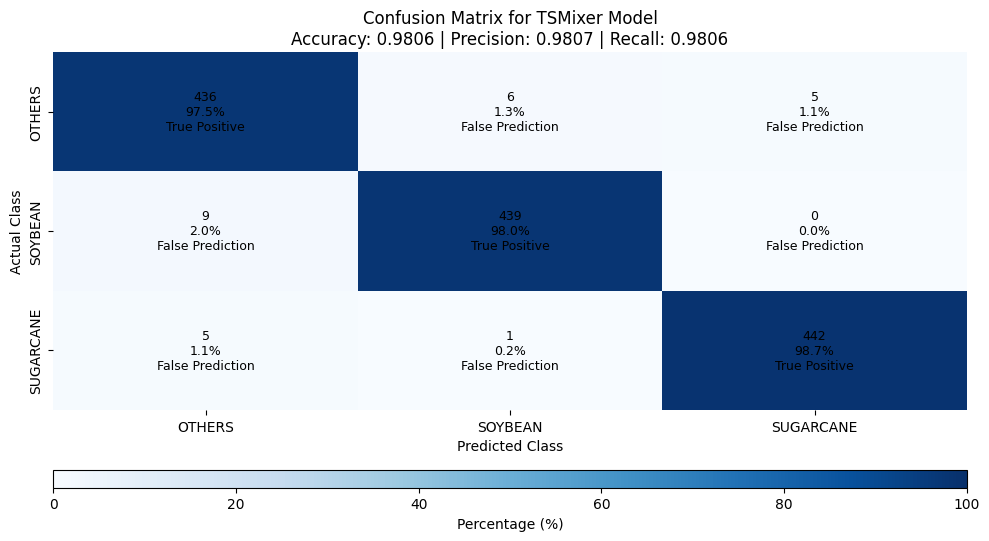

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

# === 1. Convert predictions from one-hot to class indices
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred_final, axis=1)

# === 2. Get class labels in uppercase
class_names = [cls.upper() for cls in label_encoder.classes_]

# === 3. Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# === 4. Normalize by row to get percentages
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# === 5. Compute metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

# === 6. Plot heatmap
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(
    cm_percentage,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    vmin=0,
    vmax=100,
    cbar=False,
    ax=ax
)

# === 7. Add labels to each cell
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percentage[i, j]
        label = f"{count}\n{percent:.1f}%\n{'True Positive' if i == j else 'False Prediction'}"
        ax.text(j + 0.5, i + 0.5, label, ha='center', va='center', fontsize=9, color='black')

# === 8. Titles and axis labels
ax.set_title(f"Confusion Matrix for TSMixer Model\nAccuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
ax.set_xlabel("Predicted Class")
ax.set_ylabel("Actual Class")

# === 9. Add horizontal colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.6)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=0, vmax=100)),
    cax=cax,
    orientation='horizontal'
)
cbar.set_label("Percentage (%)")
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')

plt.tight_layout(rect=[0, 0.08, 1, 1])

# === 10. Save as EPS
eps_path = '/content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_tsmixer.eps'
plt.savefig(eps_path, format='eps', dpi=300)
print(f"✅ EPS image saved to: {eps_path}")

plt.show()


In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import os

# === 0. Define SHAP type for file naming
shap_type = "TSMIXER"

# === 1. Flatten the data for SHAP's KernelExplainer
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_explain = X_test[:10]  # optionally increase this
X_explain_flat = X_explain.reshape(X_explain.shape[0], -1)

# === 2. Define prediction function for SHAP
def model_predict(X_flat):
    X_seq = X_flat.reshape((-1, 8, len(X_cols)))
    return model.predict(X_seq)

# === 3. Initialize SHAP KernelExplainer
explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])  # small background set

# === 4. Compute SHAP values
shap_values_raw = explainer.shap_values(X_explain_flat)  # shape: (n_samples, n_features, n_classes)

# === 5. Create feature names like "feature_t0"
feature_names = [f"{var}_t{t}" for t in range(8) for var in X_cols]

# === 6. Plot and save SHAP summary for each class
output_dir = '/content/drive/MyDrive/Article Temporal SugarCane'
num_classes = shap_values_raw.shape[-1]

for class_idx in range(num_classes):
    shap_vals_class = shap_values_raw[:, :, class_idx]

    try:
        class_name = label_encoder.inverse_transform([class_idx])[0].upper()
    except:
        class_name = f"CLASS_{class_idx}"

    # Create SHAP summary plot (not displayed)
    shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)

    # Save the plot
    fig = plt.gcf()
    filename = f"shap_summary_{class_name}_{shap_type}.eps"
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, format='eps', dpi=300)
    plt.close(fig)

    print(f"✅ Saved: {filepath}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 10s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 10s 1ms/step


/tmp/ipython-input-65-1444720227.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_OTHERS_TSMIXER.eps


/tmp/ipython-input-65-1444720227.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SOYBEAN_TSMIXER.eps


/tmp/ipython-input-65-1444720227.py:41: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SUGARCANE_TSMIXER.eps


 1/39 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


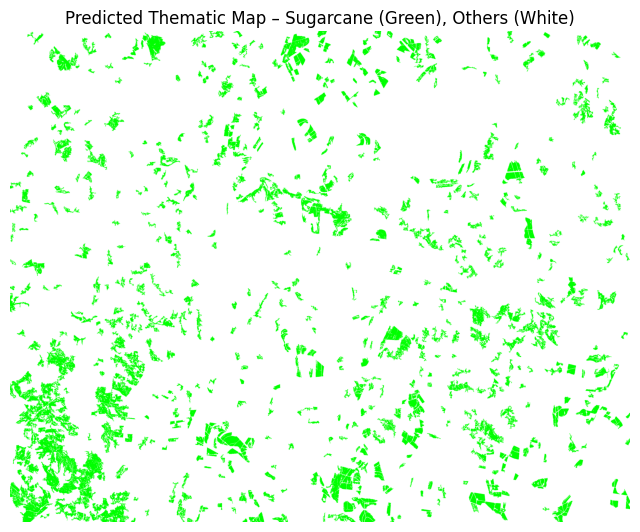

✅ Objetos classificados como cana: 900
✅ Área total estimada de cana: 96466300.00 m²


In [ ]:
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import load_model
import pickle

# === 1. Configurar imagens e gerar máscara por NDVI
pasta_imagens = "/content/cana/cana/cana/piracicaba"
arquivos_tif = [f"{i}.tif" for i in range(3, 11)]  # 8 imagens

# === Usar imagem 3.tif como referência
with rasterio.open(os.path.join(pasta_imagens, '3.tif')) as src:
    red = src.read(3).astype("float32")
    nir = src.read(4).astype("float32")

ndvi = (nir - red) / (nir + red + 1e-6)
mascara_binaria = ndvi > 0.5

# === Rotular objetos
labeled_array, _ = ndimage.label(mascara_binaria)
props = measure.regionprops(labeled_array)

# === Criar mapa com retangularidade fixa
mapa = {}
for prop in props:
    if prop.area > 300:
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        ret = prop.area / bbox_area if bbox_area else 0
        if ret > 0.25:
            mapa[prop.label] = {
                'coords': prop.coords,
                'retangularidade': ret
            }

# === 2. Extrair variáveis por tempo
dados = []
for t_idx, nome_img in enumerate(arquivos_tif):
    caminho_img = os.path.join(pasta_imagens, nome_img)
    with rasterio.open(caminho_img) as src:
        red = src.read(3).astype("float32")
        nir = src.read(4).astype("float32")
        blue = src.read(1).astype("float32")

    mask_invalid = (red == 0) | (nir == 0)
    ndvi = (nir - red) / (nir + red + 1e-6)
    evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
    msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

    ndvi[mask_invalid] = np.nan
    evi[mask_invalid] = np.nan
    msavi[mask_invalid] = np.nan

    ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
    ndvi_norm[np.isnan(ndvi)] = 0

    for obj_id, obj in mapa.items():
        coords = np.array(obj['coords'])
        ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
        evi_vals = evi[coords[:, 0], coords[:, 1]]
        msavi_vals = msavi[coords[:, 0], coords[:, 1]]
        patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

        patch = np.zeros(ndvi.shape, dtype=np.uint8)
        patch[coords[:, 0], coords[:, 1]] = patch_vals

        glcm = graycomatrix(patch, distances=[1], angles=[0], symmetric=True, normed=True)

        features = [
            obj_id,
            t_idx,
            np.sum(~np.isnan(ndvi_vals)) * 100,
            obj['retangularidade'],
            np.nanmean(ndvi_vals),
            np.nanmean(evi_vals),
            np.nanmean(msavi_vals),
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'dissimilarity')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]

        dados.append(features)

# === 3. DataFrame com dados ordenados
df = pd.DataFrame(dados, columns=[
    'object_id','time', 'area_m2', 'retangularity',
    'mean_ndvi', 'mean_evi', 'mean_msavi',
    'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
    'glcm_energy', 'glcm_correlation'
])
df = df.sort_values(by=['object_id', 'time']).reset_index(drop=True)


# === 4. Transformar para entrada da rede (usando o df diretamente)
X_cols = ['area_m2', 'retangularity', 'mean_ndvi', 'mean_evi', 'mean_msavi',
          'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation']

X_df = df[X_cols]
X_array = X_df.to_numpy()
n_objetos = df['object_id'].nunique()
X_novo = X_array.reshape(n_objetos, -1, len(X_cols))


# === 5. Carregar modelo e label_encoder
import joblib
import json
from tensorflow.keras.models import load_model

# Caminho base onde os arquivos foram salvos
# ajuste se necessário

#model = 'transformer'
#model = 'tcn'
#model = 'lstm'
#model = 'gru'
model = 'tsmixer'
#x_cols_tsmixer.jso

# Carregar scaler e label_encoder
scaler = joblib.load(f'{drive_path}/scaler_{model}.gz')
label_encoder = joblib.load(f'{drive_path}/label_encoder_{model}.gz')

# Carregar modelo
model = load_model(f'{drive_path}/{model}_model_final.h5')

# Carregar lista de colunas
with open(f'{drive_path}/x_cols_tsmixer.json', 'r') as f:
    X_cols = json.load(f)

X_novo = scaler.transform(X_array).reshape(n_objetos, -1, len(X_cols))

# === 6. Classificar
y_pred = model.predict(X_novo)
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))



mapa_pred = np.ones((*labeled_array.shape, 3))  # branco
total_area_cana = 0
qtd_obj_cana = 0
id_objetos = df['object_id'].unique()

for obj_idx, obj_id in enumerate(id_objetos):
    if classe_predita[obj_idx].lower() == 'sugarcane':
        coords = mapa[obj_id]['coords']
        for r, c in coords:
            mapa_pred[r, c] = [0, 1, 0]  # verde
        total_area_cana += df[(df['object_id'] == obj_id) & (df['time'] == 0)]['area_m2'].values[0]
        qtd_obj_cana += 1

# === 8. Visualizar
plt.figure(figsize=(8, 8))
plt.imshow(mapa_pred)
plt.title("Predicted Thematic Map – Sugarcane (Green), Others (White)")
plt.axis('off')
plt.savefig(f"TSMIXER_new_Image.eps", format='eps', bbox_inches='tight')
plt.show()

# === 9. Estatísticas
print(f"✅ Objetos classificados como cana: {qtd_obj_cana}")
print(f"✅ Área total estimada de cana: {total_area_cana:.2f} m²")



###TCN

### TCN VERSÃO 2

In [ ]:
!pip install optuna tensorflow

# === Imports
import os
import random
import numpy as np
import pandas as pd
import optuna
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Conv1D, BatchNormalization, ReLU, GlobalAveragePooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

# === 1. Semente para reprodutibilidade
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# === 2. Carregar e preparar o dataset
drive_path = "/content/drive/MyDrive/Article Temporal SugarCane"
df = pd.read_csv(f'{drive_path}/dataset_balanceado_por_objeto_estratificado.csv')
#df = pd.read_csv(f'{drive_path}/dataset_2.csv')

df['month'] = df['image'].str.extract(r'(\d+)').astype(int)
df = df.sort_values(by=['object_id', 'month']).reset_index(drop=True)
df['time'] = df.groupby('object_id').cumcount()

label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])

X_cols = [col for col in df.columns if col not in ['subfolder', 'image', 'class', 'class_encoded', 'object_id', 'time', 'month']]
scaler = StandardScaler()
df[X_cols] = scaler.fit_transform(df[X_cols])

X = df.pivot(index='object_id', columns='time', values=X_cols).values
X = X.reshape(-1, 8, len(X_cols))
y = df.groupby('object_id')['class_encoded'].first().values
y_cat = to_categorical(y)

# === 3. Separar conjunto de teste (20%)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y_cat, stratify=y, test_size=0.2, random_state=SEED
)

# === 4. Função para criar modelo TCN
def build_tcn_model(input_shape, filters, kernel_size, dropout_rate, lr):
    inputs = Input(shape=input_shape)

    x = Conv1D(filters, kernel_size, padding='causal')(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dropout(dropout_rate)(x)

    x = Conv1D(filters, kernel_size, padding='causal')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dropout(dropout_rate)(x)

    x = GlobalAveragePooling1D()(x)
    outputs = Dense(3, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# === 5. Função objetivo do Optuna usando X_temp (treinamento e validação apenas)
def objective(trial):
    filters = trial.suggest_int("filters", 32, 128)
    kernel_size = trial.suggest_int("kernel_size", 2, 5)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)

    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp,
        test_size=0.2,
        stratify=np.argmax(y_temp, axis=1),
        random_state=SEED
    )

    model = build_tcn_model(X.shape[1:], filters, kernel_size, dropout, lr)

    es = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=0)
    model.fit(X_train, y_train, validation_data=(X_val, y_val),
              epochs=30, batch_size=32, verbose=0, callbacks=[es])

    y_pred = model.predict(X_val)
    return accuracy_score(np.argmax(y_val, axis=1), np.argmax(y_pred, axis=1))

# === 6. Executar o Optuna
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=SEED))
study.optimize(objective, n_trials=15)

# === 7. Treinar modelo final com os melhores hiperparâmetros encontrados
best = study.best_params
model = build_tcn_model(X.shape[1:], best['filters'], best['kernel_size'], best['dropout'], best['lr'])

es_final = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model.fit(X_temp, y_temp, validation_split=0.2,
          epochs=50, batch_size=32, callbacks=[es_final], verbose=1)

# === 8. Avaliação final no conjunto de teste
y_pred_final = model.predict(X_test)
print("\nFinal model performance (TEST SET):")
print(classification_report(np.argmax(y_test, axis=1),
                            np.argmax(y_pred_final, axis=1),
                            target_names=[cls.upper() for cls in label_encoder.classes_]))

print("\nBest hyperparameters found:")
print(best)


[I 2025-07-21 00:20:34,185] A new study created in memory with name: no-name-67e1b219-8779-4336-b58f-2d253e874fa7


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:20:44,008] Trial 0 finished with value: 0.9404096834264432 and parameters: {'filters': 68, 'kernel_size': 5, 'dropout': 0.39279757672456206, 'lr': 0.0015751320499779737}. Best is trial 0 with value: 0.9404096834264432.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:20:50,830] Trial 1 finished with value: 0.88268156424581 and parameters: {'filters': 47, 'kernel_size': 2, 'dropout': 0.12323344486727979, 'lr': 0.005399484409787433}. Best is trial 0 with value: 0.9404096834264432.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:20:57,995] Trial 2 finished with value: 0.9553072625698324 and parameters: {'filters': 90, 'kernel_size': 4, 'dropout': 0.10823379771832098, 'lr': 0.008706020878304856}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:21:19,684] Trial 3 finished with value: 0.925512104283054 and parameters: {'filters': 112, 'kernel_size': 2, 'dropout': 0.17272998688284025, 'lr': 0.00023270677083837802}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:21:38,892] Trial 4 finished with value: 0.9189944134078212 and parameters: {'filters': 61, 'kernel_size': 4, 'dropout': 0.2727780074568463, 'lr': 0.0003823475224675188}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:21:52,795] Trial 5 finished with value: 0.9217877094972067 and parameters: {'filters': 91, 'kernel_size': 2, 'dropout': 0.21685785941408728, 'lr': 0.0005404103854647331}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:22:01,400] Trial 6 finished with value: 0.9404096834264432 and parameters: {'filters': 76, 'kernel_size': 5, 'dropout': 0.1798695128633439, 'lr': 0.0010677482709481358}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:22:27,692] Trial 7 finished with value: 0.9227188081936686 and parameters: {'filters': 89, 'kernel_size': 2, 'dropout': 0.34301794076057535, 'lr': 0.00021930485556643703}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:22:33,827] Trial 8 finished with value: 0.9227188081936686 and parameters: {'filters': 38, 'kernel_size': 5, 'dropout': 0.4862528132298237, 'lr': 0.004138040112561018}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-07-21 00:22:44,849] Trial 9 finished with value: 0.9366852886405959 and parameters: {'filters': 61, 'kernel_size': 2, 'dropout': 0.3736932106048628, 'lr': 0.0007591104805282694}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:22:52,317] Trial 10 finished with value: 0.9553072625698324 and parameters: {'filters': 124, 'kernel_size': 4, 'dropout': 0.10301892772651725, 'lr': 0.008131735182005936}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:22:59,923] Trial 11 finished with value: 0.9478584729981379 and parameters: {'filters': 125, 'kernel_size': 4, 'dropout': 0.10590487806503947, 'lr': 0.009402260173091767}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:23:08,641] Trial 12 finished with value: 0.9264432029795159 and parameters: {'filters': 105, 'kernel_size': 3, 'dropout': 0.23654350593435247, 'lr': 0.002479201332659862}. Best is trial 2 with value: 0.9553072625698324.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:23:16,082] Trial 13 finished with value: 0.957169459962756 and parameters: {'filters': 125, 'kernel_size': 4, 'dropout': 0.10665233549314655, 'lr': 0.008529032090320557}. Best is trial 13 with value: 0.957169459962756.


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-07-21 00:23:25,497] Trial 14 finished with value: 0.9217877094972067 and parameters: {'filters': 104, 'kernel_size': 3, 'dropout': 0.16480077145778188, 'lr': 0.0030074168414113062}. Best is trial 13 with value: 0.957169459962756.


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.8374 - loss: 0.4229 - val_accuracy: 0.9162 - val_loss: 0.2315
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9412 - loss: 0.1878 - val_accuracy: 0.9497 - val_loss: 0.1397
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9441 - loss: 0.1579 - val_accuracy: 0.9339 - val_loss: 0.1701
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9535 - loss: 0.1354 - val_accuracy: 0.9078 - val_loss: 0.2326
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9508 - loss: 0.1208 - val_accuracy: 0.9218 - val_loss: 0.2144
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9608 - loss: 0.1077 - val_accuracy: 0.8305 - val_loss: 0.4394
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9666 - loss: 0.0978 - val_accuracy: 0.8892 - val_loss: 0.2923
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

Final model performance (TEST SET):
              precision    r

In [ ]:
import json
import joblib
from tensorflow.keras.models import save_model

# Output directory on Google Drive
output_dir = "/content/drive/MyDrive/Article Temporal SugarCane"

# 1. Save the trained TCN model
model_path = f"{output_dir}/tcn_model.h5"
model.save(model_path)
print(f"Model saved at: {model_path}")

# 2. Save the best hyperparameters as JSON
params_path = f"{output_dir}/tcn_best_hyperparameters.json"
with open(params_path, 'w') as f:
    json.dump(best, f, indent=4)
print(f"Best hyperparameters saved at: {params_path}")

# 3. Save the scaler
scaler_path = f"{output_dir}/scaler_tcn.gz"
joblib.dump(scaler, scaler_path)
print(f"Scaler saved at: {scaler_path}")

# 4. Save the label encoder
le_path = f"{output_dir}/label_encoder_tcn.gz"
joblib.dump(label_encoder, le_path)
print(f"Label encoder saved at: {le_path}")

# 5. Save the list of feature names
xcols_path = f"{output_dir}/x_cols_tcn.json"
with open(xcols_path, 'w') as f:
    json.dump(X_cols, f)
print(f"Input feature list saved at: {xcols_path}")



Model saved at: /content/drive/MyDrive/Article Temporal SugarCane/tcn_model.h5
Best hyperparameters saved at: /content/drive/MyDrive/Article Temporal SugarCane/tcn_best_hyperparameters.json
Scaler saved at: /content/drive/MyDrive/Article Temporal SugarCane/scaler_tcn.gz
Label encoder saved at: /content/drive/MyDrive/Article Temporal SugarCane/label_encoder_tcn.gz
Input feature list saved at: /content/drive/MyDrive/Article Temporal SugarCane/x_cols_tcn.json


Confusion matrix saved as EPS at: /content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_tcn.eps


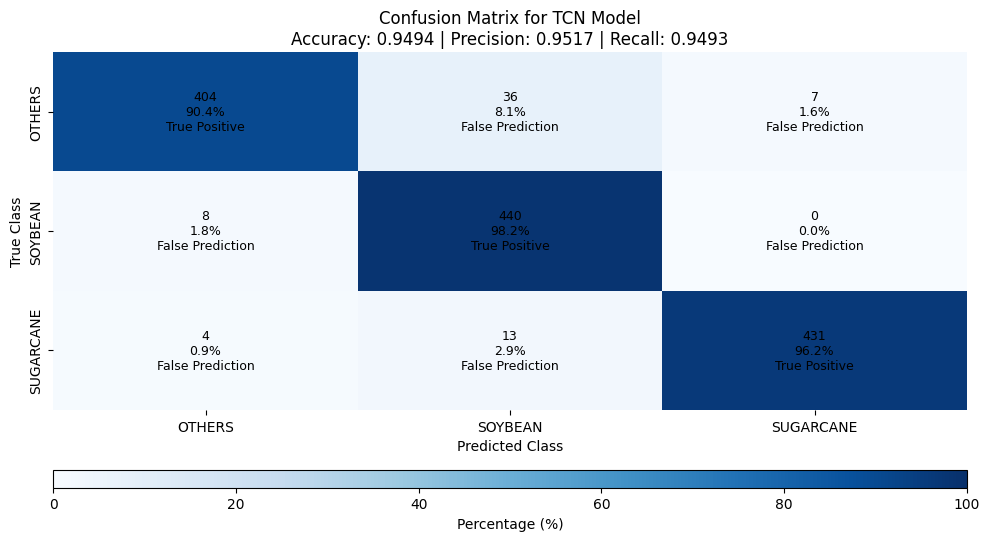

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Convert one-hot encoded labels to class indices
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred_final, axis=1)

# Get uppercase class names
class_names = [name.upper() for name in label_encoder.classes_]

# Confusion matrix (raw counts)
cm = confusion_matrix(y_true, y_pred)

# Normalize to percentages per row
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Accuracy, precision, recall
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

# Plot heatmap
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(
    cm_percentage,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    vmin=0,
    vmax=100,
    cbar=False,
    ax=ax
)

# Add detailed text annotations
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percentage[i, j]
        label = f"{count}\n{percent:.1f}%\n{'True Positive' if i == j else 'False Prediction'}"
        ax.text(j + 0.5, i + 0.5, label, ha='center', va='center', fontsize=9, color='black')

# Titles and labels
ax.set_title(f"Confusion Matrix for TCN Model\nAccuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
ax.set_xlabel("Predicted Class")
ax.set_ylabel("True Class")

# Horizontal colorbar below the plot
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.6)
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=0, vmax=100)),
    cax=cax,
    orientation='horizontal'
)
cbar.set_label("Percentage (%)")
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')

# Layout and save
plt.tight_layout(rect=[0, 0.08, 1, 1])
eps_path = "/content/drive/MyDrive/Article Temporal SugarCane/confusion_matrix_tcn.eps"
plt.savefig(eps_path, format='eps', dpi=300)
print(f"Confusion matrix saved as EPS at: {eps_path}")

# Show the plot
plt.show()


In [ ]:
!pip install shap
import shap
import numpy as np
import matplotlib.pyplot as plt
import os

# === 📦 Configurações gerais
shap_type = "TCN"
output_dir = "/content/drive/MyDrive/Article Temporal SugarCane"

# === 🔄 Preparação dos dados
X_explain = X_test[:10]
X_explain_flat = X_explain.reshape(X_explain.shape[0], -1)
X_train_flat = X_temp.reshape(X_temp.shape[0], -1)

# === 🏷️ Nomes das features no formato var_t0, var_t1, ..., var_t7
feature_names = [f"{var}_t{t}" for t in range(X.shape[1]) for var in X_cols]

# === 🔁 Função de predição no formato esperado pelo SHAP
def model_predict(X_flat):
    X_seq = X_flat.reshape((-1, X.shape[1], len(X_cols)))
    return model.predict(X_seq)

# === 📊 Inicializar o KernelExplainer com um pequeno conjunto de fundo
explainer = shap.KernelExplainer(model_predict, X_train_flat[:100])

# === 🧠 Calcular valores SHAP
shap_values = explainer.shap_values(X_explain_flat)
print("📐 SHAP shape:", shap_values.shape)

# === 💡 Gerar e salvar gráficos para cada classe
n_classes = shap_values.shape[2]

for class_idx in range(n_classes):
    try:
        class_name = label_encoder.inverse_transform([class_idx])[0].upper()
    except:
        class_name = f"CLASS_{class_idx}"

    print(f"🔎 Generating SHAP summary for class: {class_name}")

    shap_vals_class = shap_values[:, :, class_idx]

    # Criar e salvar o gráfico
    shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)

    fig = plt.gcf()
    filename = f"shap_summary_{class_name}_{shap_type}.eps"
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, format="eps", dpi=300)
    plt.close(fig)

    print(f"✅ Saved: {filepath}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
6900/6900 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step
📐 SHAP shape: (10, 80, 3)
🔎 Generating SHAP summary for class: OTHERS


/tmp/ipython-input-70-110191040.py:45: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_OTHERS_TCN.eps
🔎 Generating SHAP summary for class: SOYBEAN


/tmp/ipython-input-70-110191040.py:45: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SOYBEAN_TCN.eps
🔎 Generating SHAP summary for class: SUGARCANE


/tmp/ipython-input-70-110191040.py:45: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vals_class, X_explain_flat, feature_names=feature_names, show=False)


✅ Saved: /content/drive/MyDrive/Article Temporal SugarCane/shap_summary_SUGARCANE_TCN.eps


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


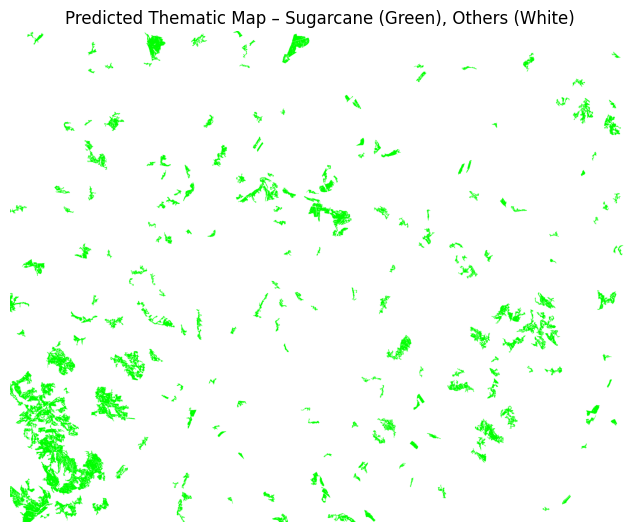

✅ Objetos classificados como cana: 244
✅ Área total estimada de cana: 43848100.00 m²


In [ ]:
!pip install rasterio
!pip install tensorflow


import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
from skimage import measure
from skimage.feature import graycomatrix, graycoprops
from scipy import ndimage
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import load_model
import pickle

# === 1. Configurar imagens e gerar máscara por NDVI
pasta_imagens = "/content/cana/cana/cana/piracicaba"
arquivos_tif = [f"{i}.tif" for i in range(3, 11)]  # 8 imagens

# === Usar imagem 3.tif como referência
with rasterio.open(os.path.join(pasta_imagens, '3.tif')) as src:
    red = src.read(3).astype("float32")
    nir = src.read(4).astype("float32")

ndvi = (nir - red) / (nir + red + 1e-6)
mascara_binaria = ndvi > 0.5

# === Rotular objetos
labeled_array, _ = ndimage.label(mascara_binaria)
props = measure.regionprops(labeled_array)

# === Criar mapa com retangularidade fixa
mapa = {}
for prop in props:
    if prop.area > 300:
        minr, minc, maxr, maxc = prop.bbox
        bbox_area = (maxr - minr) * (maxc - minc)
        ret = prop.area / bbox_area if bbox_area else 0
        if ret > 0.25:
            mapa[prop.label] = {
                'coords': prop.coords,
                'retangularidade': ret
            }

# === 2. Extrair variáveis por tempo
dados = []
for t_idx, nome_img in enumerate(arquivos_tif):
    caminho_img = os.path.join(pasta_imagens, nome_img)
    with rasterio.open(caminho_img) as src:
        red = src.read(3).astype("float32")
        nir = src.read(4).astype("float32")
        blue = src.read(1).astype("float32")

    mask_invalid = (red == 0) | (nir == 0)
    ndvi = (nir - red) / (nir + red + 1e-6)
    evi = 2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1e-6)
    msavi = (2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2

    ndvi[mask_invalid] = np.nan
    evi[mask_invalid] = np.nan
    msavi[mask_invalid] = np.nan

    ndvi_norm = (255 * (ndvi - np.nanmin(ndvi)) / (np.nanmax(ndvi) - np.nanmin(ndvi))).astype(np.uint8)
    ndvi_norm[np.isnan(ndvi)] = 0

    for obj_id, obj in mapa.items():
        coords = np.array(obj['coords'])
        ndvi_vals = ndvi[coords[:, 0], coords[:, 1]]
        evi_vals = evi[coords[:, 0], coords[:, 1]]
        msavi_vals = msavi[coords[:, 0], coords[:, 1]]
        patch_vals = ndvi_norm[coords[:, 0], coords[:, 1]]

        patch = np.zeros(ndvi.shape, dtype=np.uint8)
        patch[coords[:, 0], coords[:, 1]] = patch_vals

        glcm = graycomatrix(patch, distances=[1], angles=[0], symmetric=True, normed=True)

        features = [
            obj_id,
            t_idx,
            np.sum(~np.isnan(ndvi_vals)) * 100,
            obj['retangularidade'],
            np.nanmean(ndvi_vals),
            np.nanmean(evi_vals),
            np.nanmean(msavi_vals),
            graycoprops(glcm, 'contrast')[0, 0],
            graycoprops(glcm, 'dissimilarity')[0, 0],
            graycoprops(glcm, 'homogeneity')[0, 0],
            graycoprops(glcm, 'energy')[0, 0],
            graycoprops(glcm, 'correlation')[0, 0]
        ]

        dados.append(features)

# === 3. DataFrame com dados ordenados
df = pd.DataFrame(dados, columns=[
    'object_id','time', 'area_m2', 'retangularity',
    'mean_ndvi', 'mean_evi', 'mean_msavi',
    'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
    'glcm_energy', 'glcm_correlation'
])
df = df.sort_values(by=['object_id', 'time']).reset_index(drop=True)


# === 4. Transformar para entrada da rede (usando o df diretamente)
X_cols = ['area_m2', 'retangularity', 'mean_ndvi', 'mean_evi', 'mean_msavi',
          'glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation']

X_df = df[X_cols]
X_array = X_df.to_numpy()
n_objetos = df['object_id'].nunique()
X_novo = X_array.reshape(n_objetos, -1, len(X_cols))


# === 5. Carregar modelo e label_encoder
import joblib
import json
from tensorflow.keras.models import load_model

# Caminho base onde os arquivos foram salvos
# ajuste se necessário

#model = 'transformer'
model = 'tcn'
#model = 'lstm'
#model = 'gru'
#model = 'tsmixer'
#x_cols_tsmixer.jso

# Carregar scaler e label_encoder
scaler = joblib.load(f'{drive_path}/scaler_{model}.gz')
label_encoder = joblib.load(f'{drive_path}/label_encoder_{model}.gz')

# Carregar modelo
model = load_model(f'{drive_path}/{model}_model.h5')

# Carregar lista de colunas
with open(f'{drive_path}/x_cols_tcn.json', 'r') as f:
    X_cols = json.load(f)

X_novo = scaler.transform(X_array).reshape(n_objetos, -1, len(X_cols))

# === 6. Classificar
y_pred = model.predict(X_novo)
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))



# === Contagem direta via vetor de predição
classe_predita = label_encoder.inverse_transform(np.argmax(y_pred, axis=1))

mapa_pred = np.ones((*labeled_array.shape, 3))  # branco
total_area_cana = 0
qtd_obj_cana = 0
id_objetos = df['object_id'].unique()

for obj_idx, obj_id in enumerate(id_objetos):
    if classe_predita[obj_idx].lower() == 'sugarcane':
        coords = mapa[obj_id]['coords']
        for r, c in coords:
            mapa_pred[r, c] = [0, 1, 0]  # verde
        total_area_cana += df[(df['object_id'] == obj_id) & (df['time'] == 0)]['area_m2'].values[0]
        qtd_obj_cana += 1

# === 8. Visualizar
plt.figure(figsize=(8, 8))
plt.imshow(mapa_pred)
plt.title("Predicted Thematic Map – Sugarcane (Green), Others (White)")
plt.axis('off')

plt.savefig(f"{model}.eps", format='eps', bbox_inches='tight')
plt.savefig(f"TCN_new_Image.eps", format='eps', bbox_inches='tight')
plt.show()

# === 9. Estatísticas
print(f"✅ Objetos classificados como cana: {qtd_obj_cana}")
print(f"✅ Área total estimada de cana: {total_area_cana:.2f} m²")



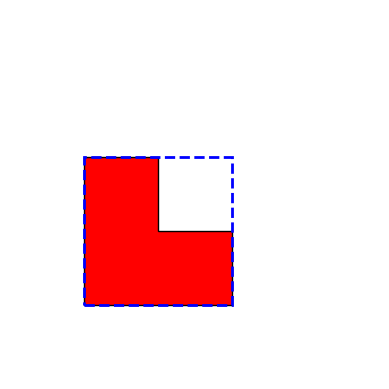

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

fig, ax = plt.subplots()

# Objeto irregular (ex: L)
object_coords = [(1, 1), (3, 1), (3, 2), (2, 2), (2, 3), (1, 3)]
polygon = patches.Polygon(object_coords, closed=True, facecolor='red', edgecolor='black')
ax.add_patch(polygon)

# Bounding box
bbox = patches.Rectangle((1, 1), 2, 2, linewidth=2, edgecolor='blue', facecolor='none', linestyle='--')
ax.add_patch(bbox)

ax.set_xlim(0, 5)
ax.set_ylim(0, 5)
ax.set_aspect('equal')
ax.axis('off')

# Salvar como EPS
plt.savefig("retangularidade_exemplo.eps", format="eps", dpi=300, bbox_inches='tight')
plt.show()
